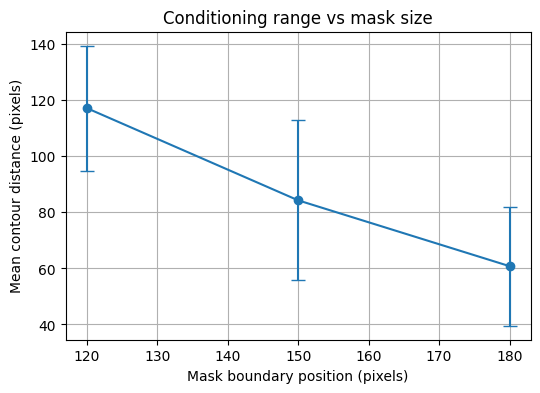

In [5]:
#Plot mask and contour distance data with error bars
import matplotlib.pyplot as plt
import numpy as np

mask_boundary = np.array([120, 150, 180])
mean_distance = np.array([117.20, 84.29, 60.80])
std_distance = np.array([22.27, 28.59, 21.26])

plt.figure(figsize=(6,4))

plt.errorbar(
    mask_boundary,
    mean_distance,
    yerr=std_distance,
    marker='o',
    capsize=5
)

plt.xlabel("Mask boundary position (pixels)")
plt.ylabel("Mean contour distance (pixels)")
plt.title("Conditioning range vs mask size")

plt.grid(True)

plt.savefig("mask_vs_distance.png", dpi=150)
plt.show()

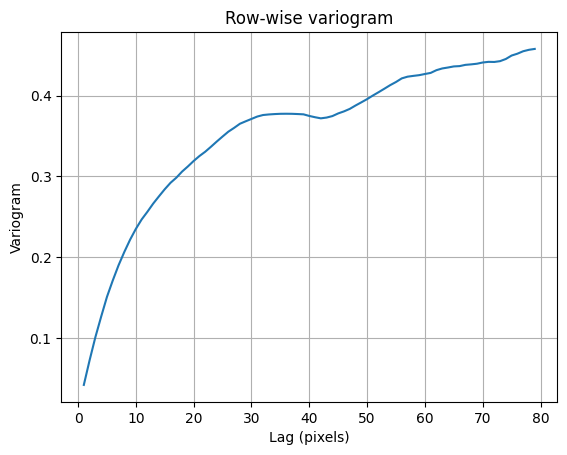

In [4]:
import numpy as np
import matplotlib.pyplot as plt

pixel_mean = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_mean_180.npy")

H, W = pixel_mean.shape

max_lag = 80

variogram = []

for lag in range(1, max_lag):

    diffs = []

    for row in range(H):

        for x in range(W - lag):

            v1 = pixel_mean[row, x]
            v2 = pixel_mean[row, x + lag]

            diffs.append((v1 - v2) ** 2)

    variogram.append(np.mean(diffs))


plt.figure()
plt.plot(range(1, max_lag), variogram)

plt.xlabel("Lag (pixels)")
plt.ylabel("Variogram")
plt.title("Row-wise variogram")

plt.grid(True)
plt.savefig("variogram.png", dpi=150)
plt.show()

/Home/siv36/hesal5042/.conda/envs/torchy/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Home/siv36/hesal5042/.conda/envs/torchy/lib/python3.12/site-packages/numpy/_core/_methods.py:147: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


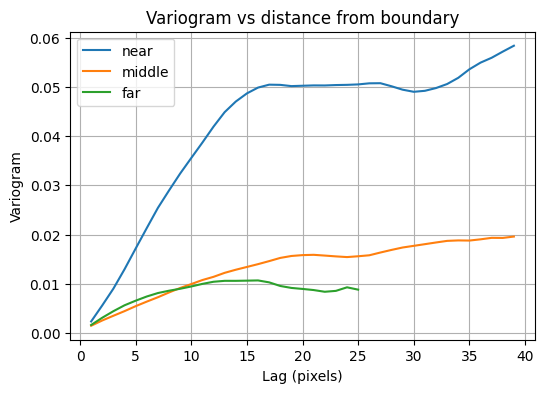

In [11]:
import numpy as np
import matplotlib.pyplot as plt

pixel_mean = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_mean_180.npy")

H, W = pixel_mean.shape

boundary = 180   # change for each mask

max_lag = 40

# regions to test
regions = {
    "near": (boundary, boundary + 20),
    "middle": (boundary + 20, boundary + 50),
    "far": (boundary + 50, boundary + 90),
}

variograms = {}

for name, (x0, x1) in regions.items():

    variogram = []

    for lag in range(1, max_lag):

        diffs = []

        for row in range(H):

            for x in range(x0, min(x1, W - lag)):

                v1 = pixel_mean[row, x]
                v2 = pixel_mean[row, x + lag]

                diffs.append((v1 - v2) ** 2)

        variogram.append(np.mean(diffs))

    variograms[name] = variogram


# plot

plt.figure(figsize=(6,4))

for name, v in variograms.items():
    plt.plot(range(1, max_lag), v, label=name)

plt.xlabel("Lag (pixels)")
plt.ylabel("Variogram")
plt.title("Variogram vs distance from boundary")
plt.legend()
plt.grid(True)
plt.savefig("variogram_by_region.png", dpi=150)
plt.show()

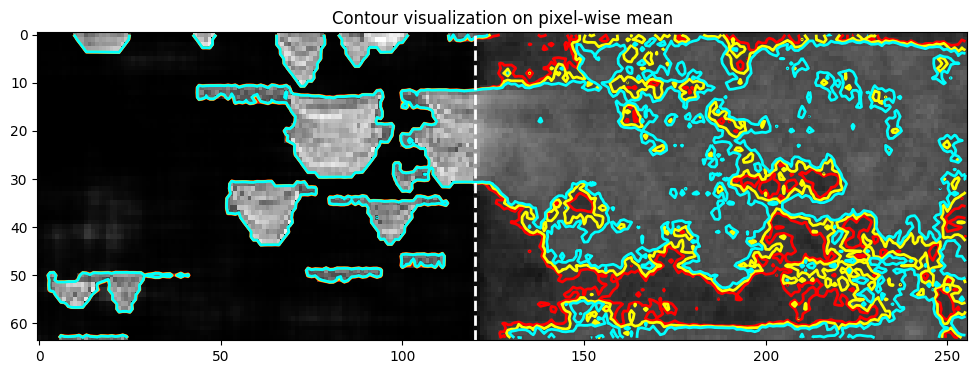

In [22]:
import numpy as np
import matplotlib.pyplot as plt

pixel_mean_120 = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_mean_120.npy")
pixel_mean = np.squeeze(pixel_mean_120)

boundary = 120
levels = [-0.55, -0.50, -0.45]

plt.figure(figsize=(12, 4))
plt.imshow(pixel_mean, cmap="gray", aspect="auto")

cs = plt.contour(pixel_mean, levels=levels, colors=["red", "yellow", "cyan"], linewidths=2)

plt.axvline(boundary, color="white", linestyle="--", linewidth=2)
plt.title("Contour visualization on pixel-wise mean")
plt.show()

In [23]:
# Check the shape and basic info
print(f"Shape of pixel_mean: {pixel_mean.shape}")
print(f"Data type: {pixel_mean.dtype}")
print(f"Value range: min={pixel_mean.min():.3f}, max={pixel_mean.max():.3f}")
print(f"Mean value: {pixel_mean.mean():.3f}")
print(f"Standard deviation: {pixel_mean.std():.3f}")

# If it's 3D (e.g., 64x256 or 256x64), we might need to squeeze
if len(pixel_mean.shape) > 2:
    pixel_mean = pixel_mean.squeeze()
    print(f"After squeezing: {pixel_mean.shape}")


# Check the shape and basic info
print(f"Shape of pixel_mean: {pixel_mean.shape}")
print(f"Value range: min={pixel_mean.min():.3f}, max={pixel_mean.max():.3f}")

# If it's 3D (e.g., 64x256 or 256x64), we might need to squeeze
if len(pixel_mean.shape) > 2:
    pixel_mean = pixel_mean.squeeze()
    print(f"After squeezing: {pixel_mean.shape}")

# Create meshgrid for your dimensions
height, width = pixel_mean.shape
X, Y = np.meshgrid(np.arange(width), np.arange(height))

# Define mask boundaries (120px mask on 256 width)
mask_start, mask_end = 68, 188

Shape of pixel_mean: (64, 256)
Data type: float32
Value range: min=-1.000, max=1.000
Mean value: -0.580
Standard deviation: 0.377
Shape of pixel_mean: (64, 256)
Value range: min=-1.000, max=1.000


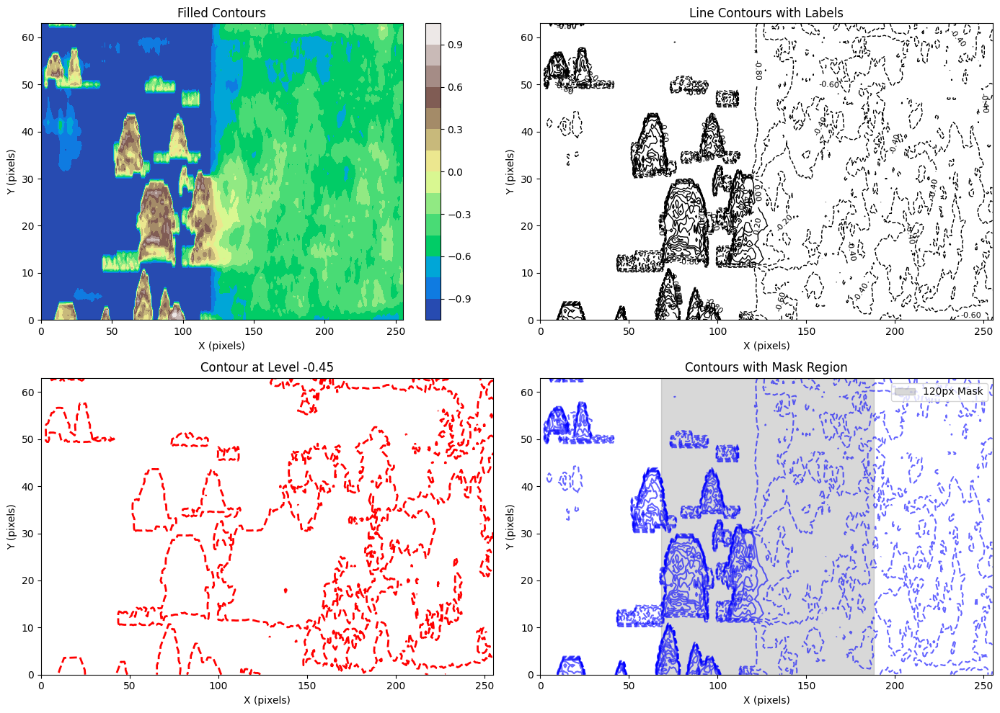

In [24]:
# Simple contour plot without trying to extract data
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Filled contours
ax1 = axes[0, 0]
contour_filled = ax1.contourf(X, Y, pixel_mean, levels=15, cmap='terrain')
ax1.set_title('Filled Contours')
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
plt.colorbar(contour_filled, ax=ax1)

# Plot 2: Line contours
ax2 = axes[0, 1]
contour_lines = ax2.contour(X, Y, pixel_mean, levels=10, colors='black', linewidths=1)
ax2.clabel(contour_lines, inline=True, fontsize=8, fmt='%1.2f')
ax2.set_title('Line Contours with Labels')
ax2.set_xlabel('X (pixels)')
ax2.set_ylabel('Y (pixels)')

# Plot 3: Single contour at specific level
ax3 = axes[1, 0]
target_level = -0.45
single_contour = ax3.contour(X, Y, pixel_mean, levels=[target_level], colors='red', linewidths=2)
ax3.set_title(f'Contour at Level {target_level}')
ax3.set_xlabel('X (pixels)')
ax3.set_ylabel('Y (pixels)')

# Plot 4: Contour with mask
ax4 = axes[1, 1]
contour_masked = ax4.contour(X, Y, pixel_mean, levels=10, colors='blue', alpha=0.6)
ax4.axvspan(mask_start, mask_end, alpha=0.3, color='gray', label='120px Mask')
ax4.set_title('Contours with Mask Region')
ax4.set_xlabel('X (pixels)')
ax4.set_ylabel('Y (pixels)')
ax4.legend()

plt.tight_layout()
plt.show()

In [25]:
# To actually extract and quantify contour data, use this approach
def extract_contour_data(X, Y, Z, levels):
    """
    Extract contour vertices for given levels
    """
    contour_data = {}
    
    for level in levels:
        # Create contour for this level
        cs = plt.contour(X, Y, Z, levels=[level])
        
        # Extract vertices from the contour
        vertices_list = []
        # Get all segments for this level
        for seg in cs.allsegs[0]:  # allsegs[0] because we only have one level
            if len(seg) > 0:  # Check if segment has points
                vertices_list.append(seg)
        
        contour_data[level] = vertices_list
        
        # Close the plot to avoid displaying
        plt.close()
    
    return contour_data

# Extract contours at multiple levels
levels_of_interest = np.linspace(pixel_mean.min(), pixel_mean.max(), 10)
contour_data = extract_contour_data(X, Y, pixel_mean, levels_of_interest)

# Now quantify these contours
print("CONTOUR QUANTIFICATION RESULTS")
print("="*60)

for level, contours in contour_data.items():
    print(f"\nLevel {level:.3f}: {len(contours)} contour segment(s)")
    
    for i, contour in enumerate(contours):
        if len(contour) > 10:  # Only quantify meaningful contours
            # Calculate length
            length = np.sum(np.sqrt(np.sum(np.diff(contour, axis=0)**2, axis=1)))
            
            # Calculate amplitude (vertical range)
            amplitude = np.ptp(contour[:, 1])
            
            # Check if contour intersects mask
            x_coords = contour[:, 0]
            in_mask = np.any((x_coords >= mask_start) & (x_coords <= mask_end))
            
            print(f"  Segment {i+1}:")
            print(f"    Length: {length:.1f} pixels")
            print(f"    Amplitude: {amplitude:.1f} pixels")
            print(f"    Points: {len(contour)}")
            print(f"    Intersects mask: {in_mask}")

CONTOUR QUANTIFICATION RESULTS

Level -1.000: 1 contour segment(s)

Level -0.778: 19 contour segment(s)
  Segment 1:
    Length: 19.6 pixels
    Amplitude: 3.9 pixels
    Points: 24
    Intersects mask: False
  Segment 2:
    Length: 9.8 pixels
    Amplitude: 2.9 pixels
    Points: 12
    Intersects mask: False
  Segment 3:
    Length: 28.6 pixels
    Amplitude: 10.9 pixels
    Points: 35
    Intersects mask: True
  Segment 4:
    Length: 27.9 pixels
    Amplitude: 6.8 pixels
    Points: 35
    Intersects mask: True
  Segment 5:
    Length: 20.2 pixels
    Amplitude: 0.8 pixels
    Points: 21
    Intersects mask: False
  Segment 6:
    Length: 164.8 pixels
    Amplitude: 63.0 pixels
    Points: 196
    Intersects mask: True
  Segment 7:
    Length: 146.1 pixels
    Amplitude: 19.7 pixels
    Points: 161
    Intersects mask: True
  Segment 8:
    Length: 69.8 pixels
    Amplitude: 13.7 pixels
    Points: 79
    Intersects mask: True
  Segment 9:
    Length: 80.3 pixels
    Amplitude: 10

/tmp/ipykernel_2858767/439912524.py:35: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


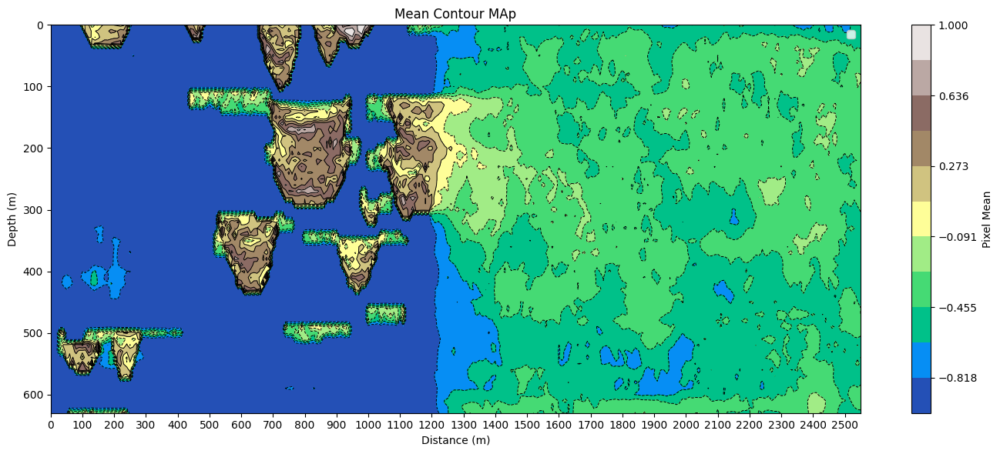

In [28]:
import numpy as np
import matplotlib.pyplot as plt

pixel_mean_180 = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_mean_120.npy")
pixel_mean = np.squeeze(pixel_mean_180)

H, W = pixel_mean.shape
x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

levels = np.linspace(pixel_mean.min(), pixel_mean.max(), 12)

fig, ax = plt.subplots(figsize=(14, 6))

# filled contour map
cf = ax.contourf(X, Y, pixel_mean, levels=levels, cmap="terrain")

# contour lines
cs = ax.contour(X, Y, pixel_mean, levels=levels, colors="black", linewidths=0.7)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Mean Contour MAp")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel Mean")

plt.tight_layout()
plt.savefig("mean_contour.png", dpi=300, bbox_inches="tight")
plt.show()
# contour labels
# ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

# ax.invert_yaxis()
# ax.set_title("Pixel Mean Contour Map")
# ax.set_xlabel("X (pixels)")
# ax.set_ylabel("Z (pixels)")

# cbar = fig.colorbar(cf, ax=ax)
# cbar.set_label("Pixel mean")

# plt.tight_layout()
# plt.savefig("pixel_mean_contour_map.png", dpi=200, bbox_inches="tight")
plt.show()

## Contour Map

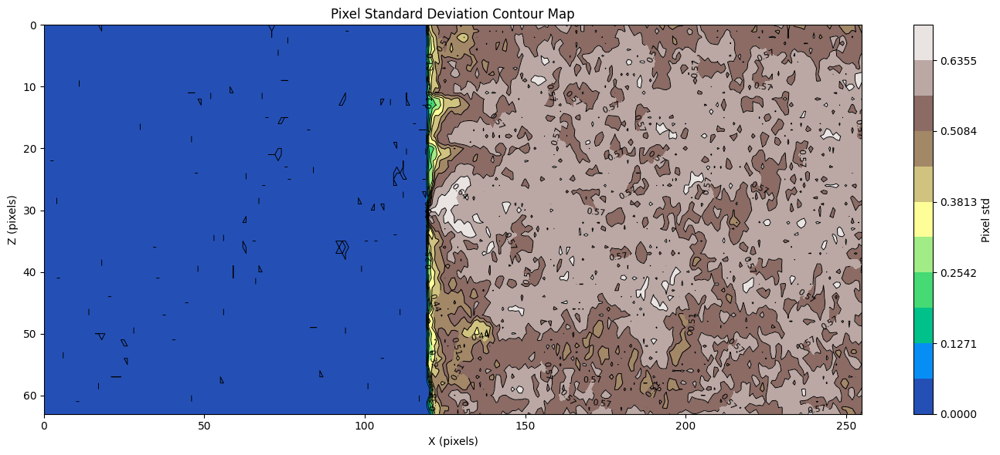

In [3]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std_180 = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_std_120.npy")
pixel_std = np.squeeze(pixel_std_180)

H, W = pixel_std.shape
x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 12)

fig, ax = plt.subplots(figsize=(14, 6))

# filled contour map
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")

# contour lines
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)

# contour labels
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.invert_yaxis()
ax.set_title("Pixel Standard Deviation Contour Map")
ax.set_xlabel("X (pixels)")
ax.set_ylabel("Z (pixels)")

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel std")

plt.tight_layout()
# plt.savefig("pixel_mean_contour_map.png", dpi=200, bbox_inches="tight")
plt.show()

/tmp/ipykernel_2782202/2432444760.py:53: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


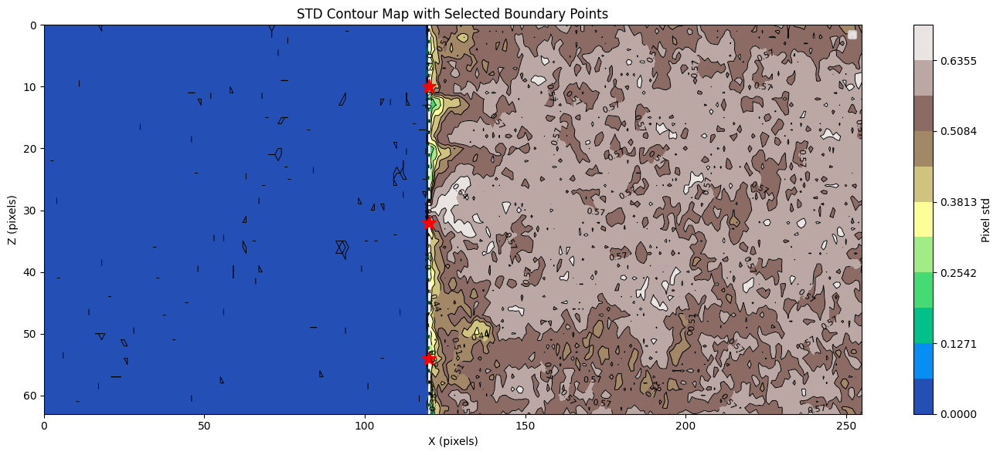

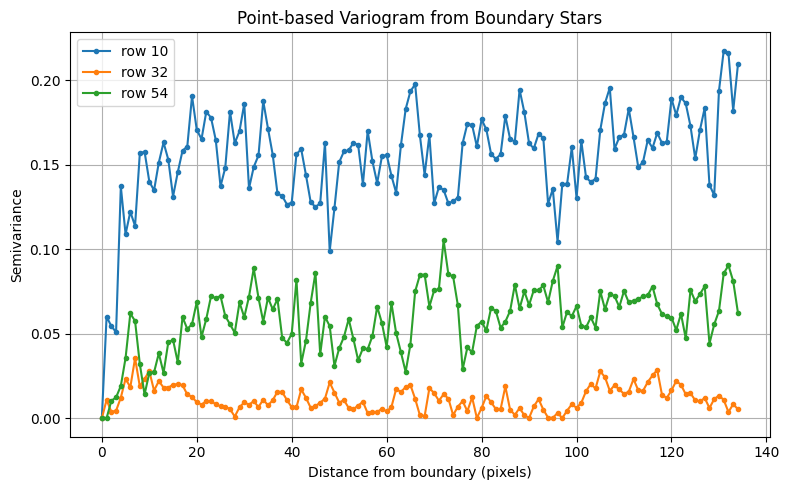

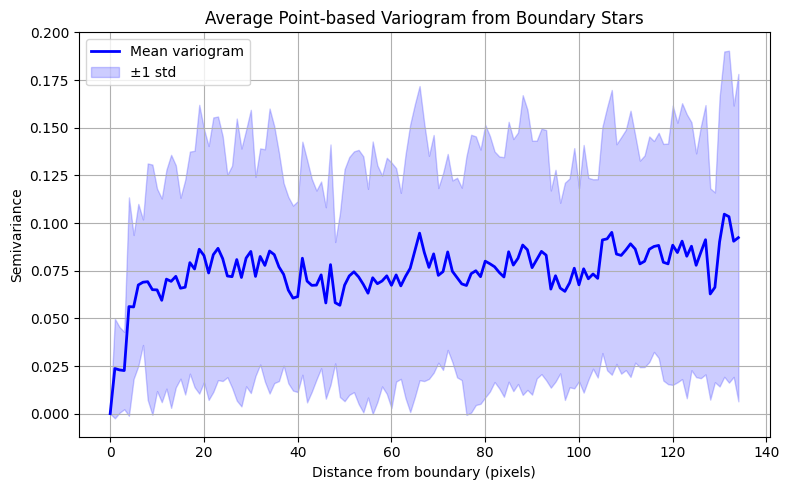

Selected star rows: [10, 32, 54]
Boundary column: 120

STD value at each star:
  row 10: 0.1954
  row 32: 0.4955
  row 54: 0.3023

Mean semivariance at final lag: 0.092339955


In [9]:
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------
# Load STD field
# --------------------------------------------------
pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_std_120.npy"
)
pixel_std = np.squeeze(pixel_std)

H, W = pixel_std.shape
x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

# --------------------------------------------------
# Boundary position
# --------------------------------------------------
boundary = 120   # change to 150 or 180 for other masks

# --------------------------------------------------
# Choose 3 boundary points (top, middle, bottom)
# Avoid very edges to reduce artifacts
# --------------------------------------------------
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

# --------------------------------------------------
# Plot contour map with stars
# --------------------------------------------------
levels = np.linspace(pixel_std.min(), pixel_std.max(), 12)

fig, ax = plt.subplots(figsize=(14, 6))

# Filled contours
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")

# Contour lines
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

# Mask boundary
ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# Stars on boundary
ax.plot(points_x, points_y, "*", color="red", markersize=14)

ax.invert_yaxis()
ax.set_title("STD Contour Map with Selected Boundary Points")
ax.set_xlabel("X (pixels)")
ax.set_ylabel("Z (pixels)")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel std")

plt.tight_layout()
plt.savefig("std_contour_with_stars.png", dpi=200, bbox_inches="tight")
plt.show()

# --------------------------------------------------
# Point-based variogram from each star
# --------------------------------------------------
max_lag = W - boundary - 1
lags = np.arange(0, max_lag)

variograms = {}

for py in points_y:
    z0 = pixel_std[py, boundary]

    gamma = []
    for h in lags:
        zh = pixel_std[py, boundary + h]
        gamma.append((zh - z0) ** 2)

    variograms[py] = np.array(gamma)

# --------------------------------------------------
# Plot variogram for each star
# --------------------------------------------------
plt.figure(figsize=(8, 5))

for py, gamma in variograms.items():
    plt.plot(lags, gamma, marker='o', markersize=3, label=f"row {py}")

plt.xlabel("Distance from boundary (pixels)")
plt.ylabel("Semivariance")
plt.title("Point-based Variogram from Boundary Stars")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("variogram_from_stars.png", dpi=200, bbox_inches="tight")
plt.show()

# --------------------------------------------------
# Mean variogram across stars
# --------------------------------------------------
all_gamma = np.stack(list(variograms.values()), axis=0)
mean_gamma = np.mean(all_gamma, axis=0)
std_gamma = np.std(all_gamma, axis=0)

plt.figure(figsize=(8, 5))
plt.plot(lags, mean_gamma, color="blue", linewidth=2, label="Mean variogram")
plt.fill_between(
    lags,
    mean_gamma - std_gamma,
    mean_gamma + std_gamma,
    color="blue",
    alpha=0.2,
    label="±1 std"
)
plt.xlabel("Distance from boundary (pixels)")
plt.ylabel("Semivariance")
plt.title("Average Point-based Variogram from Boundary Stars")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("mean_variogram_from_stars.png", dpi=200, bbox_inches="tight")
plt.show()

# --------------------------------------------------
# Print summary
# --------------------------------------------------
print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

print("\nMean semivariance at final lag:", mean_gamma[-1])

/tmp/ipykernel_3732904/3588960185.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


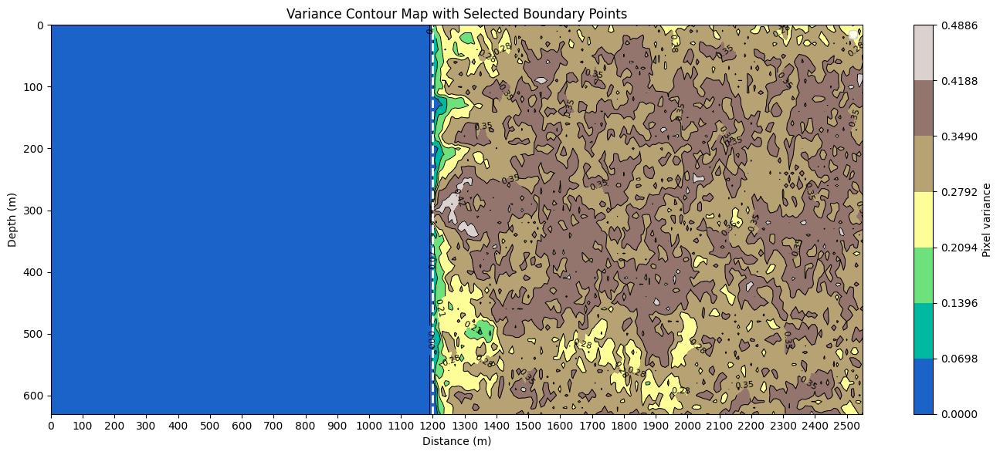

Selected star rows: [10, 32, 54]
Boundary column: 120

STD value at each star:
  row 10: 0.0382
  row 32: 0.2455
  row 54: 0.0914

Mean semivariance at final lag: 0.014375412


In [7]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_std_120.npy"
)
pixel_std = np.squeeze(pixel_std)
pixel_std = pixel_std**2 #convertig to variance
pixel_std[pixel_std < 1e-8] = 0 #avoiding numerical issues
#variance is zero but before the contour was showing line for tiny floating-point differences

H, W = pixel_std.shape



x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

boundary = 120   #150 or 180

#coundaries
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 8)

fig, ax = plt.subplots(figsize=(14, 6))
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# ax.plot(points_x, points_y, "*", color="red", markersize=14)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Variance Contour Map with Selected Boundary Points")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel variance")

plt.tight_layout()
plt.savefig("variance_contour_with_stars_meters.png", dpi=300, bbox_inches="tight")
plt.show()


#variogram for each star
max_lag = W - boundary - 5  
lags = np.arange(1, max_lag)
half_window = 4  # to average over a small window around the star
data = pixel_std[:, boundary:]
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # window of rows around the selected point
    window = data[y0:y1, :]   # shape: (n_rows, n_cols)

    gamma = []

    for h in lags:
        if h == 0:
            continue
        diffs = []

        for r in range(window.shape[0]):
            row = window[r, :]

            # all pairs separated by lag h
            d = row[h:] - row[:-h]
            diffs.extend(d ** 2)

        # semivariance = 0.5 * mean squared difference
        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# plt.xlabel("Distance from boundary (pixels)")
# plt.ylabel("Semivariance")
# plt.title("Point-based Variogram from Boundary Stars")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.savefig("variogram_from_stars.png", dpi=300, bbox_inches="tight")
# plt.show()
# all_gamma = np.stack(list(variograms.values()), axis=0)
# mean_gamma = np.mean(all_gamma, axis=0)
# std_gamma = np.std(all_gamma, axis=0)

# plt.figure(figsize=(8, 5))
# plt.plot(lags, mean_gamma, color="blue", linewidth=2, label="Mean variogram")
# plt.fill_between(
#     lags,
#     mean_gamma - std_gamma,
#     mean_gamma + std_gamma,
#     color="blue",
#     alpha=0.2,
#     label="±1 std"
# )
# plt.xlabel("Distance from boundary (pixels)")
# plt.ylabel("Semivariance")
# plt.title("Average Point-based Variogram from Boundary Stars")
# plt.grid(True)
# plt.legend()
# plt.tight_layout()
# plt.savefig("mean_variogram_from_stars.png", dpi=200, bbox_inches="tight")
# plt.show()

print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

print("\nMean semivariance at final lag:", mean_gamma[-1])


## Variograms

In [ ]:
#checking the shape of one realization
r = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/50/repaint_sample_000.npy")
print(r.shape)

(1, 1, 64, 256)


In [ ]:
#checking the shape of one realization
r = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/50/repaint_sample_000.npy")
print(r.shape)
import glob
files = glob.glob("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/50/repaint_sample_*.npy")
samples = np.stack([np.load(f) for f in files], axis=0)
samples = np.squeeze(samples) #remove any extra dimensions if they exist
print(samples.shape)
N, H, W = samples.shape


Row 10
Empirical variance: 0.3507
Estimated sill: 0.3564
Ratio: 1.016

Row 32
Empirical variance: 0.3656
Estimated sill: 0.3966
Ratio: 1.085

Row 54
Empirical variance: 0.3110
Estimated sill: 0.3056
Ratio: 0.983


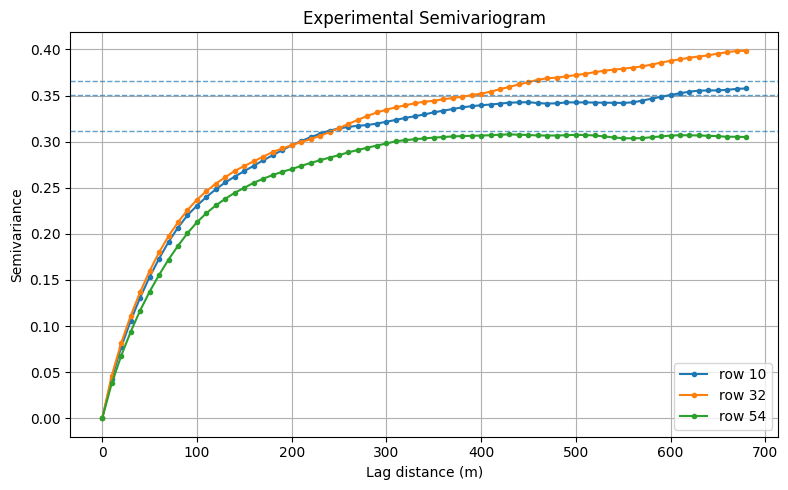

In [21]:
boundary = 120
points_y = [10, 32, 54]
half_window = 4
pixel_size_m = 10

# only use region to the right of boundary
samples_right = samples[:, :, boundary:]   # shape: (N, H, W_right)

# choose moderate lags
# max_lag = min(60, samples_right.shape[2] - 1)
max_lag = samples_right.shape[2] //2
lags = np.arange(0, max_lag + 1)

variograms = {}
empirical_vars = {}
pair_counts = {}

# --------------------------------------------------
# Experimental semivariogram:
# gamma(h) = 0.5 * mean[(Z(x+h) - Z(x))^2]
# --------------------------------------------------
for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # shape: (N, n_rows, n_cols)
    window = samples_right[:, y0:y1, :]

    gamma = []
    counts = []

    # empirical variance in this window
    empirical_vars[py] = np.var(window)

    for h in lags:
        if h == 0:
            gamma.append(0.0)
            counts.append(window.size)
            continue

        left = window[:, :, :-h]
        right = window[:, :, h:]

        diffs = right - left
        gamma.append(0.5 * np.mean(diffs ** 2))
        counts.append(diffs.size)

    variograms[py] = np.array(gamma)
    pair_counts[py] = np.array(counts)

# --------------------------------------------------
# Plot semivariogram for each selected row window
# --------------------------------------------------
plt.figure(figsize=(8, 5))
for py, gamma in variograms.items():
    sill_estimate = np.mean(gamma[-5:])
    var = empirical_vars[py]

    print(f"\nRow {py}")
    print(f"Empirical variance: {var:.4f}")
    print(f"Estimated sill: {sill_estimate:.4f}")
    print(f"Ratio: {sill_estimate/var:.3f}")
    plt.plot(
        lags * pixel_size_m,
        gamma,
        marker="o",
        markersize=3,
        label=f"row {py}"
    )
    plt.axhline(
        empirical_vars[py],
        linestyle="--",
        linewidth=1,
        alpha=0.7
    )

plt.xlabel("Lag distance (m)")
plt.ylabel("Semivariance")
plt.title("Experimental Semivariogram")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("semivarogram_from_diffusion_realizations.png", dpi=400, bbox_inches="tight")
plt.show()





## Variogram for 100 Realizations

In [3]:
#checking the shape of one realization
import numpy as np
r = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/100/repaint_sample_000.npy")
print(r.shape)

(1, 1, 64, 256)


(100, 64, 256)

Row 10
Empirical variance: 0.3386
Estimated sill: 0.3910
Ratio: 1.155

Row 32
Empirical variance: 0.3585
Estimated sill: 0.3650
Ratio: 1.018

Row 54
Empirical variance: 0.3065
Estimated sill: 0.2892
Ratio: 0.944


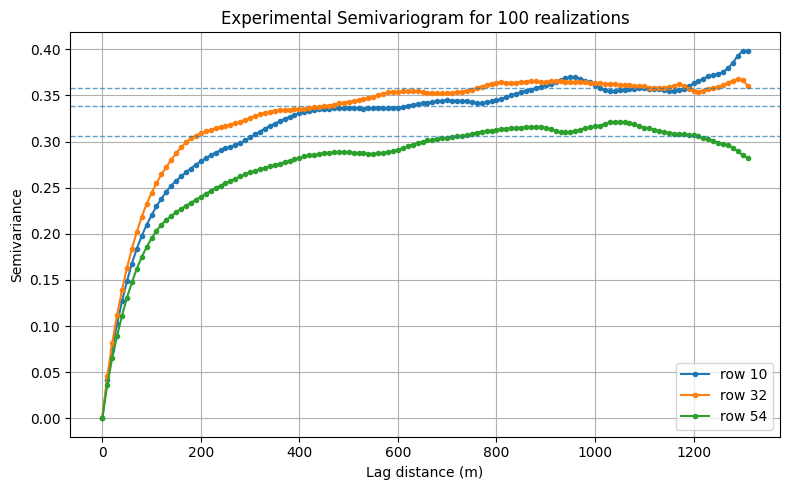

In [33]:
import matplotlib.pyplot as plt
import glob


files = glob.glob("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/100/repaint_sample_*.npy")
samples = np.stack([np.load(f) for f in files], axis=0)
samples = np.squeeze(samples) #remove any extra dimensions if they exist
print(samples.shape)
N, H, W = samples.shape
boundary = 120
points_y = [10, 32, 54]
half_window = 4
pixel_size_m = 10

# only use region to the right of boundary
samples_right = samples[:, :, boundary:]   # shape: (N, H, W_right)

# choose moderate lags
# max_lag = min(60, samples_right.shape[2] - 1)
max_lag = samples_right.shape[2] - 5
lags = np.arange(0, max_lag + 1)

variograms = {}
empirical_vars = {}
pair_counts = {}

# --------------------------------------------------
# Experimental semivariogram:
# gamma(h) = 0.5 * mean[(Z(x+h) - Z(x))^2]
# --------------------------------------------------
for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # shape: (N, n_rows, n_cols)
    window = samples_right[:, y0:y1, :]

    gamma = []
    counts = []

    # empirical variance in this window
    empirical_vars[py] = np.var(window)

    for h in lags:
        if h == 0:
            gamma.append(0.0)
            counts.append(window.size)
            continue

        left = window[:, :, :-h]
        right = window[:, :, h:]

        diffs = right - left
        gamma.append(0.5 * np.mean(diffs ** 2))
        counts.append(diffs.size)

    variograms[py] = np.array(gamma)
    pair_counts[py] = np.array(counts)

# --------------------------------------------------
# Plot semivariogram for each selected row window
# --------------------------------------------------
plt.figure(figsize=(8, 5))
for py, gamma in variograms.items():
    sill_estimate = np.mean(gamma[-5:])
    var = empirical_vars[py]

    print(f"\nRow {py}")
    print(f"Empirical variance: {var:.4f}")
    print(f"Estimated sill: {sill_estimate:.4f}")
    print(f"Ratio: {sill_estimate/var:.3f}")
    plt.plot(
        lags * pixel_size_m,
        gamma,
        marker="o",
        markersize=3,
        label=f"row {py}"
    )
    plt.axhline(
        empirical_vars[py],
        linestyle="--",
        linewidth=1,
        alpha=0.7
    )

plt.xlabel("Lag distance (m)")
plt.ylabel("Semivariance")
plt.title("Experimental Semivariogram for 100 realizations")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("semivarogram_from_diffusion_realizations_100realizations.png", dpi=400, bbox_inches="tight")
plt.show()





## Contour for 100 Realizations

/tmp/ipykernel_1520514/180075683.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


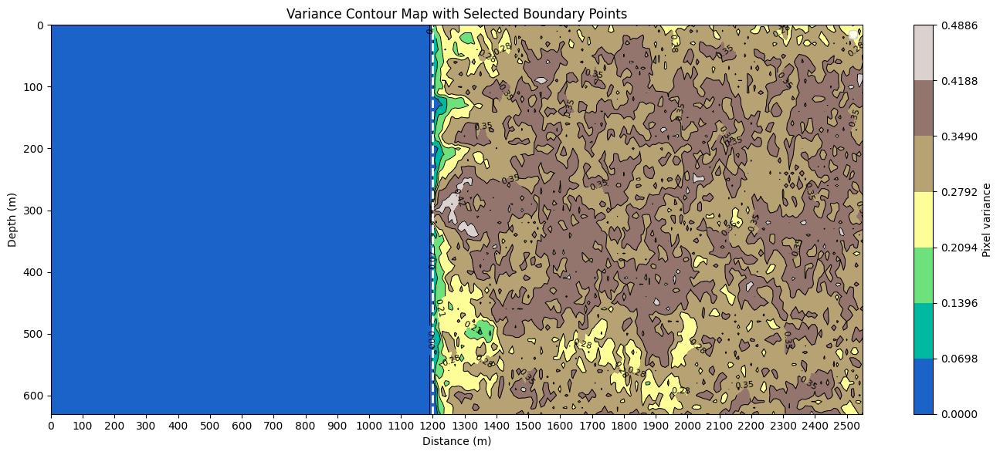

Selected star rows: [10, 32, 54]
Boundary column: 120

STD value at each star:
  row 10: 0.0382
  row 32: 0.2455
  row 54: 0.0914


In [3]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_std_120_100realizations.npy"
)
pixel_std = np.squeeze(pixel_std)
pixel_std = pixel_std**2 #convertig to variance
pixel_std[pixel_std < 1e-8] = 0 #avoiding numerical issues
#variance is zero but before the contour was showing line for tiny floating-point differences

H, W = pixel_std.shape



x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

boundary = 120   #150 or 180

#coundaries
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 8)

fig, ax = plt.subplots(figsize=(14, 6))
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# ax.plot(points_x, points_y, "*", color="red", markersize=14)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Variance Contour Map with Selected Boundary Points")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel variance")

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/contour_map/100_variance_contour_with_stars_meters.png", dpi=300, bbox_inches="tight")
plt.show()


#variogram for each star
max_lag = W - boundary - 5  
lags = np.arange(1, max_lag)
half_window = 4  # to average over a small window around the star
data = pixel_std[:, boundary:]
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # window of rows around the selected point
    window = data[y0:y1, :]   # shape: (n_rows, n_cols)

    gamma = []

    for h in lags:
        if h == 0:
            continue
        diffs = []

        for r in range(window.shape[0]):
            row = window[r, :]

            # all pairs separated by lag h
            d = row[h:] - row[:-h]
            diffs.extend(d ** 2)

        # semivariance = 0.5 * mean squared difference
        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

# print("\nMean semivariance at final lag:", mean_gamma[-1])


## 1. Test data

##### test data: /Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/slice_XZ_numpy_patches

Total patch files found: 2200
Test data shape: (100, 64, 256)
Shape after squeeze: (100, 64, 256)


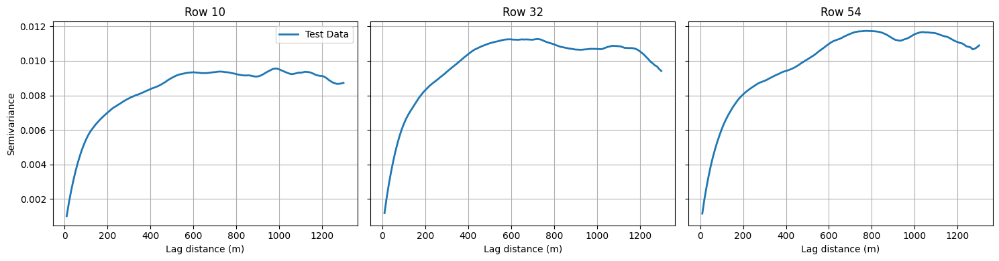

Used 100 test patches
Selected rows: [10, 32, 54]
Boundary: 120


In [ ]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/slice_XZ_numpy_patches"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 100, replace=False)

# load selected patches
test_data = np.stack([np.load(f) for f in selected_files])

print("Test data shape:", test_data.shape)   # should be (100, H, W)

# if patches have extra singleton dimension, remove it
test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * 10

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Test Data", linewidth=2)
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/100_variogram_test_vs_unconditional_meters.png", dpi=300)
plt.show()

# -----------------------------------
# INFO
# -----------------------------------
print("Used 100 test patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

In [10]:
sample = np.load(patch_files[0])
print(sample.shape)

(64, 256)


## Unconditional

unconditional samples: /Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/patch_epoch_{epoch}.npy

In [26]:
import numpy as np

epoch = 120  # or whichever epoch you want
file_path = f"/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/patch_epoch_100.npy"

samples = np.load(file_path)
print(samples.shape)

(1, 1, 64, 256)


In [27]:
uncond_data = np.squeeze(samples)[:100]
print(uncond_data.shape)

(64, 256)


Total patch files found: 100
Unconditional variograms shape: (100, 1, 1, 64, 256)
Shape after squeeze: (100, 64, 256)


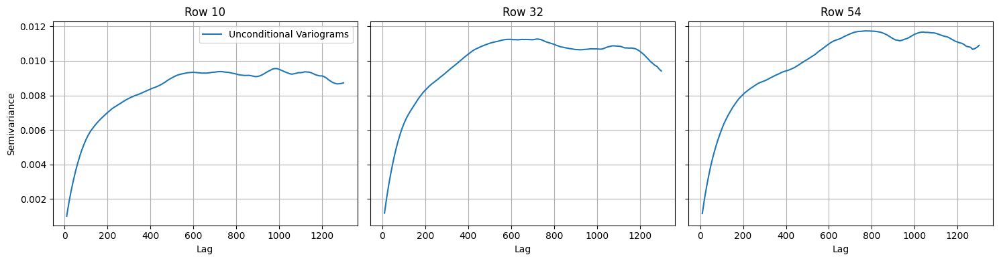

Used 100 Unconditional patches
Selected rows: [10, 32, 54]
Boundary: 120


In [ ]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 100, replace=False)

# load selected patches
variograms_uncond = np.stack([np.load(f) for f in selected_files])

print("Unconditional variograms shape:", variograms_uncond.shape)

# if patches have extra singleton dimension, remove it
variograms_uncond = np.squeeze(variograms_uncond)
print("Shape after squeeze:", variograms_uncond.shape)

N, H, W = variograms_uncond.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


lags = lags * 10  # convert to meters
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags, variograms[py], label="Unconditional Variograms")
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/100_variogram_uncond.png", dpi=300)
plt.show()


print("Used 100 Unconditional patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

conditioning does change the spatial structure but higher variance compare to test data. 

unconditional model partially captures spatial variability but fails to accurately reproduce the true spatial correlation structure observed in the test data.

### Conditional 50 samples

Total patch files found: 50
Test data shape: (50, 1, 1, 64, 256)
Shape after squeeze: (50, 64, 256)


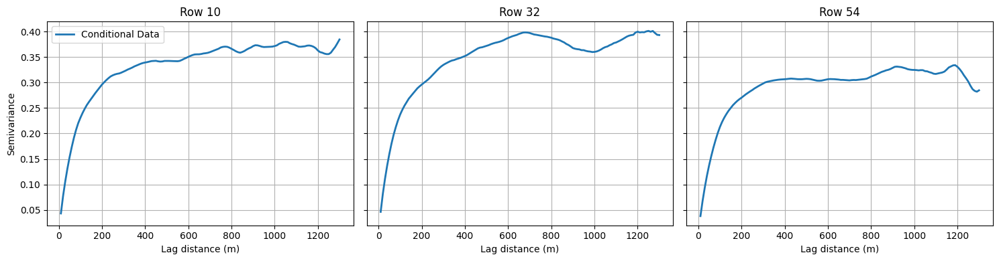

Used 50 test patches
Selected rows: [10, 32, 54]
Boundary: 120


In [11]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/50"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 50, replace=False)

# load selected patches
test_data = np.stack([np.load(f) for f in selected_files])

print("Test data shape:", test_data.shape)   # should be (100, H, W)

# if patches have extra singleton dimension, remove it
test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * 10

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Data", linewidth=2)
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/50_variogram_cond.png", dpi=300)
plt.show()

# -----------------------------------
# INFO
# -----------------------------------
print("Used 50 test patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

### Conditional 100 samples

Total patch files found: 100
Test data shape: (100, 1, 1, 64, 256)
Shape after squeeze: (100, 64, 256)


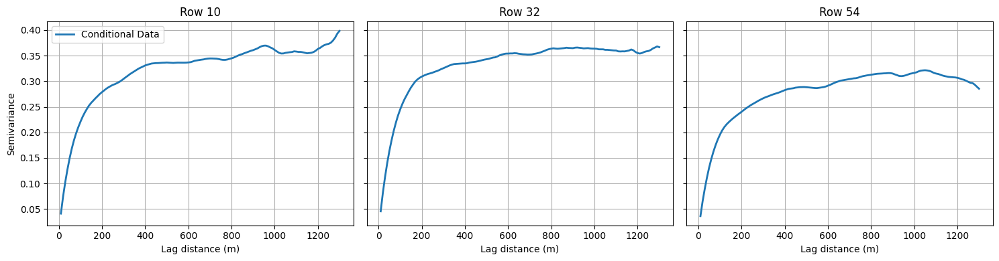

Used 50 test patches
Selected rows: [10, 32, 54]
Boundary: 120


In [9]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/trial/100"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 100, replace=False)

# load selected patches
test_data = np.stack([np.load(f) for f in selected_files])

print("Test data shape:", test_data.shape)   # should be (100, H, W)

# if patches have extra singleton dimension, remove it
test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * 10

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Data", linewidth=2)
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/100_variogram_cond.png", dpi=300)
plt.show()

# -----------------------------------
# INFO
# -----------------------------------
print("Used 50 test patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

### 50 Normalized Samples
#### 1. Variogram

Total patch files found: 50
Test data shape: (50, 1, 1, 64, 256)
Shape after squeeze: (50, 64, 256)


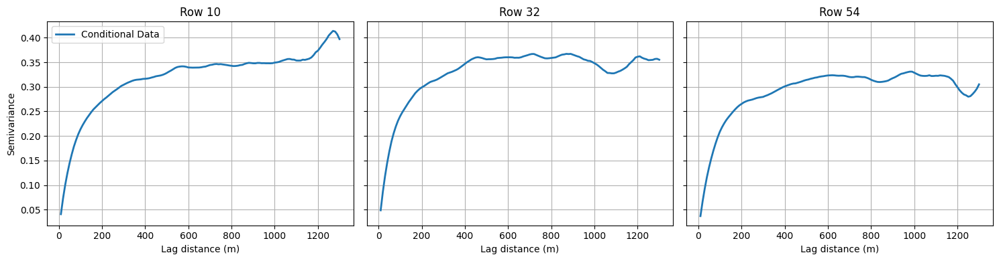

Used 50 test patches
Selected rows: [10, 32, 54]
Boundary: 120


In [14]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/final"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 50, replace=False)

# load selected patches
test_data = np.stack([np.load(f) for f in selected_files])

print("Test data shape:", test_data.shape)   # should be (100, H, W)

# if patches have extra singleton dimension, remove it
test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * 10

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Data", linewidth=2)
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/50_Normalized_variogram_cond.png", dpi=300)
plt.show()

# -----------------------------------
# INFO
# -----------------------------------
print("Used 50 test patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

### 2. Contour

# 1000 Samples
## 1. Conditional
#### Variogram

Total patch files found: 1000
Test data shape: (1000, 1, 1, 64, 256)
Shape after squeeze: (1000, 64, 256)


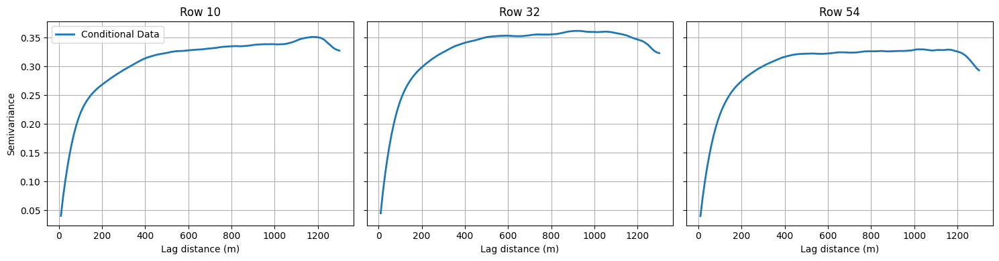

Used 1000 test patches
Selected rows: [10, 32, 54]
Boundary: 120


In [ ]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/final"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 1000, replace=False)

# load selected patches
test_data = np.stack([np.load(f) for f in selected_files])

print("Conditional data shape:", test_data.shape)   # should be (100, H, W)

# if patches have extra singleton dimension, remove it
test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * 10

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Data", linewidth=2)
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/1000_Normalized_variogram_cond.png", dpi=300)
plt.show()

# -----------------------------------
# INFO
# -----------------------------------
print("Used 1000 conditional  patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

Total sample files found: 1000
Conditional data shape: (1000, 1, 1, 64, 256)
Shape after squeeze: (1000, 64, 256)


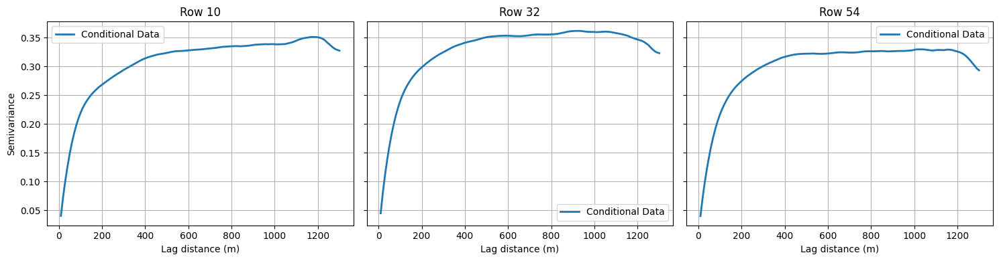


===== SILL CHECK =====

Row 10
Empirical variance: 0.3373
Estimated sill:     0.3369
Ratio sill/var:     0.999

Row 32
Empirical variance: 0.3548
Estimated sill:     0.3585
Ratio sill/var:     1.010

Row 54
Empirical variance: 0.3299
Estimated sill:     0.3269
Ratio sill/var:     0.991

Used 1000 conditional patches
Selected rows: [10, 32, 54]
Boundary: 120


In [6]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/repaint_ensemble/final"

# Only individual samples, not ensemble.npy
patch_files = sorted(glob.glob(os.path.join(patch_folder, "sample_*.npy")))

print(f"Total sample files found: {len(patch_files)}")

np.random.seed(0)
selected_files = np.random.choice(patch_files, 1000, replace=False)

test_data = np.stack([np.load(f) for f in selected_files])
print("Conditional data shape:", test_data.shape)

test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4
pixel_size_m = 10

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

variograms = {}
empirical_vars = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # Same spatial window used for variogram
    window_all = test_data[:, y0:y1, boundary:]

    # Empirical variance of that window
    empirical_vars[py] = np.var(window_all)

    gamma = []

    for h in lags:
        left = window_all[:, :, :-h]
        right = window_all[:, :, h:]

        diffs = right - left
        gamma.append(0.5 * np.mean(diffs ** 2))

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * pixel_size_m

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Data", linewidth=2)

    # # empirical variance = expected sill
    # axes[i].axhline(
    #     empirical_vars[py],
    #     linestyle="--",
    #     linewidth=1.5,
    #     label=f"Empirical variance = {empirical_vars[py]:.3f}"
    # )

    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)
    axes[i].legend()

axes[0].set_ylabel("Semivariance")

plt.tight_layout()
plt.savefig(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/1000_Normalized_variogram_cond.png",
    dpi=300
)
plt.show()

# -----------------------------------
# SILL CHECK
# -----------------------------------
print("\n===== SILL CHECK =====")

# Use stable plateau region, avoid final edge-effect tail
plateau_mask = (lags_m >= 700) & (lags_m <= 1100)

for py in points_y:
    sill_estimate = np.mean(variograms[py][plateau_mask])
    var = empirical_vars[py]

    print(f"\nRow {py}")
    print(f"Empirical variance: {var:.4f}")
    print(f"Estimated sill:     {sill_estimate:.4f}")
    print(f"Ratio sill/var:     {sill_estimate / var:.3f}")

print("\nUsed 1000 conditional patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

#### Contour Map

/tmp/ipykernel_3274872/3635284479.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


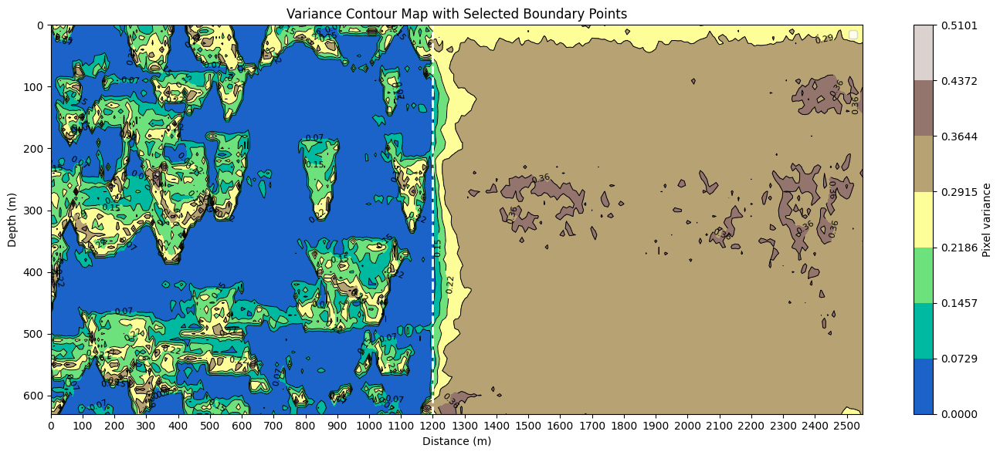

Selected star rows: [10, 32, 54]
Boundary column: 120

STD value at each star:
  row 10: 0.0644
  row 32: 0.0546
  row 54: 0.0843


In [14]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/unpixel_std_120_1000.npy"
)
pixel_std = np.squeeze(pixel_std)
pixel_std = pixel_std**2 #convertig to variance
pixel_std[pixel_std < 1e-8] = 0 #avoiding numerical issues
#variance is zero but before the contour was showing line for tiny floating-point differences

H, W = pixel_std.shape



x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

boundary = 120   #150 or 180

#coundaries
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 8)

fig, ax = plt.subplots(figsize=(14, 6))
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# ax.plot(points_x, points_y, "*", color="red", markersize=14)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Variance Contour Map with Selected Boundary Points")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel variance")

plt.tight_layout()
# plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/contour_map/1000_variance_contour_with_stars_meters.png", dpi=300, bbox_inches="tight")
plt.show()


#variogram for each star
max_lag = W - boundary - 5  
lags = np.arange(1, max_lag)
half_window = 4  # to average over a small window around the star
data = pixel_std[:, boundary:]
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # window of rows around the selected point
    window = data[y0:y1, :]   # shape: (n_rows, n_cols)

    gamma = []

    for h in lags:
        if h == 0:
            continue
        diffs = []

        for r in range(window.shape[0]):
            row = window[r, :]

            # all pairs separated by lag h
            d = row[h:] - row[:-h]
            diffs.extend(d ** 2)

        # semivariance = 0.5 * mean squared difference
        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

# print("\nMean semivariance at final lag:", mean_gamma[-1])


## 2. Test Data
### Variogram

Total patch files found: 2200
Test data shape: (1000, 64, 256)
Shape after squeeze: (1000, 64, 256)


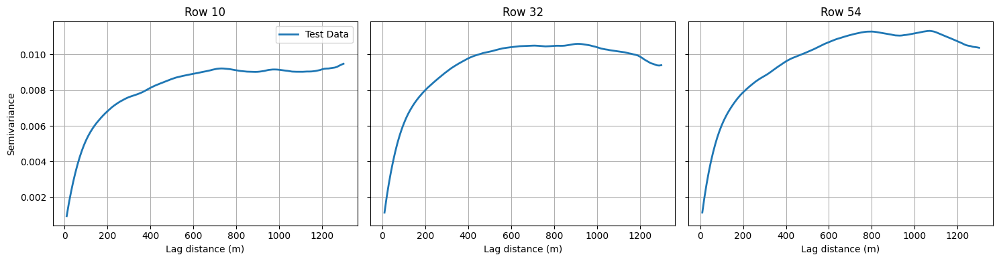

Used 1000 test patches
Selected rows: [10, 32, 54]
Boundary: 120


In [1]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/slice_XZ_numpy_patches"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 1000, replace=False)

# load selected patches
test_data = np.stack([np.load(f) for f in selected_files])

print("Test data shape:", test_data.shape)   # should be (1000, H, W)

# if patches have extra singleton dimension, remove it
test_data = np.squeeze(test_data)
print("Shape after squeeze:", test_data.shape)

N, H, W = test_data.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)

# -----------------------------------
# PLOT
# -----------------------------------
lags_m = lags * 10

fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Test Data", linewidth=2)
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/1000_variogram_test_vs_unconditional_meters.png", dpi=300)
plt.show()

# -----------------------------------
# INFO
# -----------------------------------
print("Used 1000 test patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

### Contour Map

/tmp/ipykernel_3274872/241366376.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


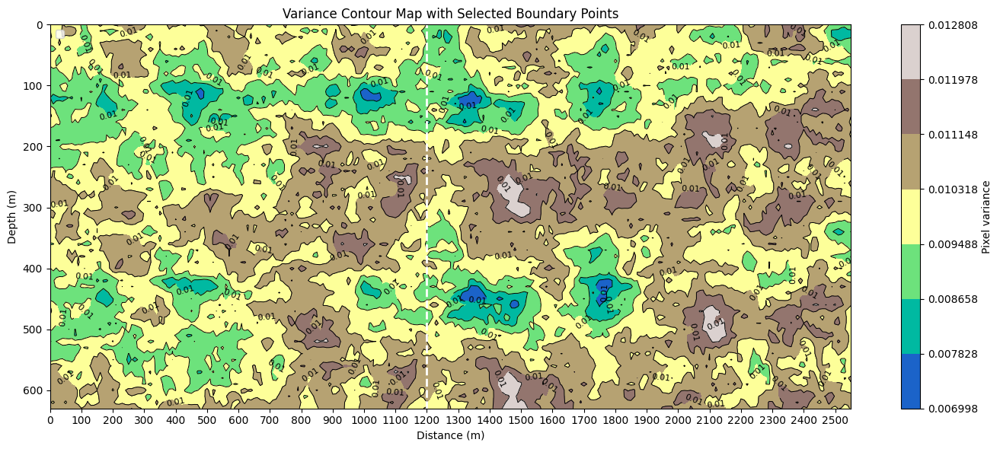

Selected star rows: [10, 32, 54]
Boundary column: 120

STD value at each star:
  row 10: 0.0095
  row 32: 0.0100
  row 54: 0.0102


In [8]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/test_pixel_std_120_1000.npy"
)
pixel_std = np.squeeze(pixel_std)
pixel_std = pixel_std**2 #convertig to variance
pixel_std[pixel_std < 1e-8] = 0 #avoiding numerical issues
#variance is zero but before the contour was showing line for tiny floating-point differences

H, W = pixel_std.shape



x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

boundary = 120   #150 or 180

#coundaries
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 8)

fig, ax = plt.subplots(figsize=(14, 6))
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# ax.plot(points_x, points_y, "*", color="red", markersize=14)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Variance Contour Map with Selected Boundary Points")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel variance")

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/contour_map/test_1000_variance_contour_with_stars_meters.png", dpi=300, bbox_inches="tight")
plt.show()


#variogram for each star
max_lag = W - boundary - 5  
lags = np.arange(1, max_lag)
half_window = 4  # to average over a small window around the star
data = pixel_std[:, boundary:]
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # window of rows around the selected point
    window = data[y0:y1, :]   # shape: (n_rows, n_cols)

    gamma = []

    for h in lags:
        if h == 0:
            continue
        diffs = []

        for r in range(window.shape[0]):
            row = window[r, :]

            # all pairs separated by lag h
            d = row[h:] - row[:-h]
            diffs.extend(d ** 2)

        # semivariance = 0.5 * mean squared difference
        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

# print("\nMean semivariance at final lag:", mean_gamma[-1])


## 3. Unconditional
### Variogram

Total patch files found: 100
Unconditional variograms shape: (100, 1, 1, 64, 256)
Shape after squeeze: (100, 64, 256)


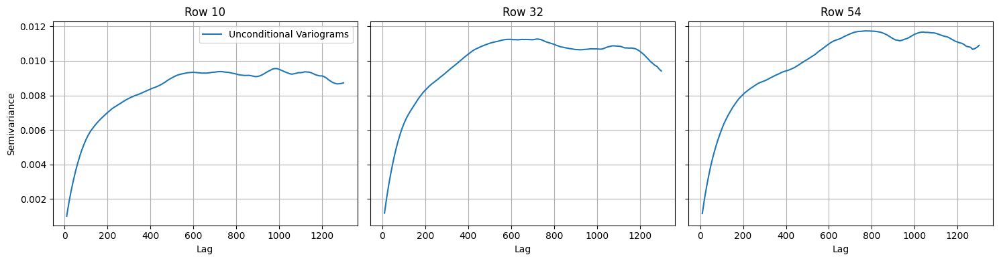

Used 1000 Unconditional patches
Selected rows: [10, 32, 54]
Boundary: 120


In [5]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------
# PATH TO TEST DATA PATCHES
# -----------------------------------
patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

print(f"Total patch files found: {len(patch_files)}")

# -----------------------------------
# SELECT 100 RANDOM PATCHES
# -----------------------------------
np.random.seed(0)
selected_files = np.random.choice(patch_files, 100, replace=False)

# load selected patches
variograms_uncond = np.stack([np.load(f) for f in selected_files])

print("Unconditional variograms shape:", variograms_uncond.shape)

# if patches have extra singleton dimension, remove it
variograms_uncond = np.squeeze(variograms_uncond)
print("Shape after squeeze:", variograms_uncond.shape)

N, H, W = variograms_uncond.shape

# -----------------------------------
# PARAMETERS
# -----------------------------------
boundary = 120
points_y = [10, H // 2, H - 10]
half_window = 4

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)

# -----------------------------------
# COMPUTE VARIOGRAMS
# -----------------------------------
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    gamma = []

    for h in lags:
        diffs = []

        for n in range(N):
            window = test_data[n, y0:y1, boundary:]   # rows around selected point

            for r in range(window.shape[0]):
                row = window[r, :]
                d = row[h:] - row[:-h]
                diffs.extend(d**2)

        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


lags = lags * 10  # convert to meters
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags, variograms[py], label="Unconditional Variograms")
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag")
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")
axes[0].legend()

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/1000_variogram_uncond.png", dpi=300)
plt.show()


print("Used 1000 Unconditional patches")
print("Selected rows:", points_y)
print("Boundary:", boundary)

### Contour Map

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_geology_output/model100.pth"
)
pixel_std = np.squeeze(pixel_std)
pixel_std = pixel_std**2 #convertig to variance
pixel_std[pixel_std < 1e-8] = 0 #avoiding numerical issues
#variance is zero but before the contour was showing line for tiny floating-point differences

H, W = pixel_std.shape



x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

boundary = 120   #150 or 180

#coundaries
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 8)

fig, ax = plt.subplots(figsize=(14, 6))
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# ax.plot(points_x, points_y, "*", color="red", markersize=14)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Variance Contour Map with Selected Boundary Points")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel variance")

plt.tight_layout()
# plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/contour_map/uncond_1000_variance_contour_with_stars_meters.png", dpi=300, bbox_inches="tight")
plt.show()


#variogram for each star
max_lag = W - boundary - 5  
lags = np.arange(1, max_lag)
half_window = 4  # to average over a small window around the star
data = pixel_std[:, boundary:]
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # window of rows around the selected point
    window = data[y0:y1, :]   # shape: (n_rows, n_cols)

    gamma = []

    for h in lags:
        if h == 0:
            continue
        diffs = []

        for r in range(window.shape[0]):
            row = window[r, :]

            # all pairs separated by lag h
            d = row[h:] - row[:-h]
            diffs.extend(d ** 2)

        # semivariance = 0.5 * mean squared difference
        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

# print("\nMean semivariance at final lag:", mean_gamma[-1])


TypeError: ufunc 'square' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

pixel_std = np.load(
    "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/pixel_std_120_1000.npy"
)
pixel_std = np.squeeze(pixel_std)
pixel_std = pixel_std**2 #convertig to variance
pixel_std[pixel_std < 1e-8] = 0 #avoiding numerical issues
#variance is zero but before the contour was showing line for tiny floating-point differences

H, W = pixel_std.shape



x = np.arange(W)
y = np.arange(H)
X, Y = np.meshgrid(x, y)

boundary = 120   #150 or 180

#coundaries
points_y = [10, H // 2, H - 10]
points_x = [boundary] * len(points_y)

levels = np.linspace(pixel_std.min(), pixel_std.max(), 8)

fig, ax = plt.subplots(figsize=(14, 6))
cf = ax.contourf(X, Y, pixel_std, levels=levels, cmap="terrain")
cs = ax.contour(X, Y, pixel_std, levels=levels, colors="black", linewidths=0.7)
ax.clabel(cs, inline=True, fontsize=8, fmt="%.2f")

ax.axvline(boundary, color="white", linestyle="--", linewidth=2)

# ax.plot(points_x, points_y, "*", color="red", markersize=14)
xticks = np.arange(0, W, 10)
yticks = np.arange(0, H, 10)

ax.set_xticks(xticks)
ax.set_yticks(yticks)

ax.set_xticklabels(xticks * 10)
ax.set_yticklabels(yticks * 10)

ax.set_xlabel("Distance (m)")
ax.set_ylabel("Depth (m)")

ax.invert_yaxis()
ax.set_title("Variance Contour Map with Selected Boundary Points")
ax.legend()

cbar = fig.colorbar(cf, ax=ax)
cbar.set_label("Pixel variance")

plt.tight_layout()
plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/contour_map/1000_variance_contour_with_stars_meters.png", dpi=300, bbox_inches="tight")
plt.show()


#variogram for each star
max_lag = W - boundary - 5  
lags = np.arange(1, max_lag)
half_window = 4  # to average over a small window around the star
data = pixel_std[:, boundary:]
variograms = {}

for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    # window of rows around the selected point
    window = data[y0:y1, :]   # shape: (n_rows, n_cols)

    gamma = []

    for h in lags:
        if h == 0:
            continue
        diffs = []

        for r in range(window.shape[0]):
            row = window[r, :]

            # all pairs separated by lag h
            d = row[h:] - row[:-h]
            diffs.extend(d ** 2)

        # semivariance = 0.5 * mean squared difference
        gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

    variograms[py] = np.array(gamma)


print("Selected star rows:", points_y)
print("Boundary column:", boundary)
print("\nSTD value at each star:")
for py in points_y:
    print(f"  row {py}: {pixel_std[py, boundary]:.4f}")

# print("\nMean semivariance at final lag:", mean_gamma[-1])


# Lets start Fresh

### Variograms

Ensemble shape: (100, 64, 256)


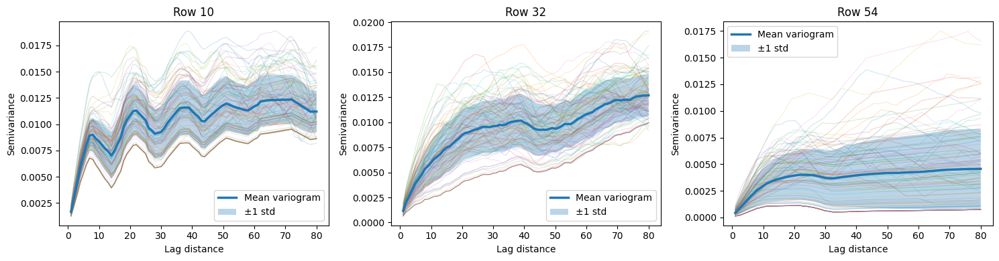

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------
# Load ensemble
# -----------------------------
ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/repaint_results/ensemble.npy")  # shape: (N, H, W)
print("Ensemble shape:", ensemble.shape)

# -----------------------------
# 1D variogram for one row
# -----------------------------
def variogram_1d(values, max_lag=80):
    """
    values: 1D array, one row of image
    """
    gammas = []

    for h in range(1, max_lag + 1):
        diff = values[h:] - values[:-h]
        gamma = 0.5 * np.mean(diff ** 2)
        gammas.append(gamma)

    return np.arange(1, max_lag + 1), np.array(gammas)


# -----------------------------
# Compute variograms for 3 rows
# -----------------------------
rows = [10, 32, 54]
max_lag = 80

plt.figure(figsize=(15, 4))

for i, row in enumerate(rows):
    all_variograms = []

    for r in range(ensemble.shape[0]):
        row_values = ensemble[r, row, :]  # one row from one realization
        lags, gamma = variogram_1d(row_values, max_lag=max_lag)
        all_variograms.append(gamma)

    all_variograms = np.array(all_variograms)

    mean_gamma = all_variograms.mean(axis=0)
    std_gamma = all_variograms.std(axis=0)

    plt.subplot(1, 3, i + 1)

    # plot all realizations lightly
    for g in all_variograms:
        plt.plot(lags, g, alpha=0.2, linewidth=0.8)

    # plot mean
    plt.plot(lags, mean_gamma, linewidth=2.5, label="Mean variogram")

    # uncertainty band
    plt.fill_between(
        lags,
        mean_gamma - std_gamma,
        mean_gamma + std_gamma,
        alpha=0.3,
        label="±1 std"
    )

    plt.title(f"Row {row}")
    plt.xlabel("Lag distance")
    plt.ylabel("Semivariance")
    plt.legend()

plt.tight_layout()
# plt.savefig("variograms_3_rows.png", dpi=150)
plt.show()

Ensemble shape: (100, 64, 256)
Shape after squeeze: (100, 64, 256)


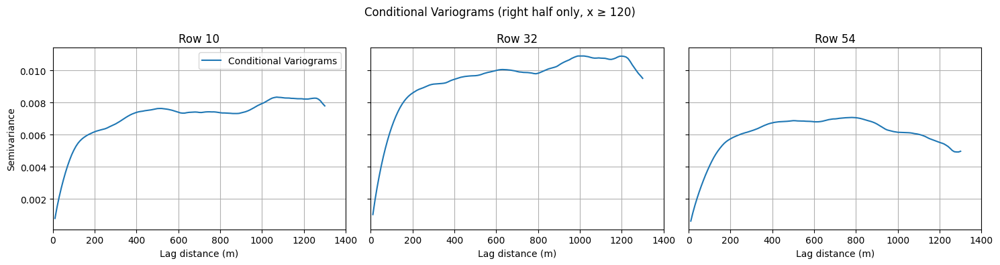

Samples used: 100
Selected rows: [10, 32, 54]
Boundary: 120


In [39]:
import os
import numpy as np
import matplotlib.pyplot as plt

# load ensemble
patch_files = np.load("/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/repaint_results/ensemble.npy")
print("Ensemble shape:", patch_files.shape)

samples = np.squeeze(patch_files)
print("Shape after squeeze:", samples.shape)

N, H, W = samples.shape

# parameters
boundary   = 120
points_y   = [10, H // 2, H - 10]
half_window = 4
max_lag    = W - boundary - 5
lags       = np.arange(1, max_lag)

# vectorized variogram computation
variograms = {}
for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    window = samples[:, y0:y1, boundary:]  # (N, n_rows, n_cols_right)

    gamma = []
    for h in lags:
        d = window[:, :, h:] - window[:, :, :-h]
        gamma.append(0.5 * np.mean(d**2))

    variograms[py] = np.array(gamma)

lags_m = lags * 10  # convert pixels to meters

# plot
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Variograms")
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)
    axes[i].set_xlim(0, 1400)  # truncate unstable large lags

axes[0].set_ylabel("Semivariance")
axes[0].legend()
plt.suptitle("Conditional Variograms (right half only, x ≥ 120)", fontsize=12)
plt.tight_layout()
plt.show()

print("Samples used:", N)
print("Selected rows:", points_y)
print("Boundary:", boundary)

## Mean STD 

Ensemble shape: (100, 64, 256)
Mean map shape: (64, 256)
Std map shape: (64, 256)


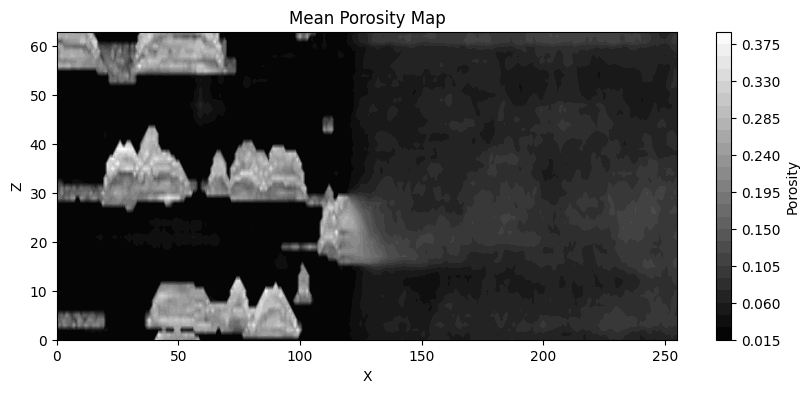

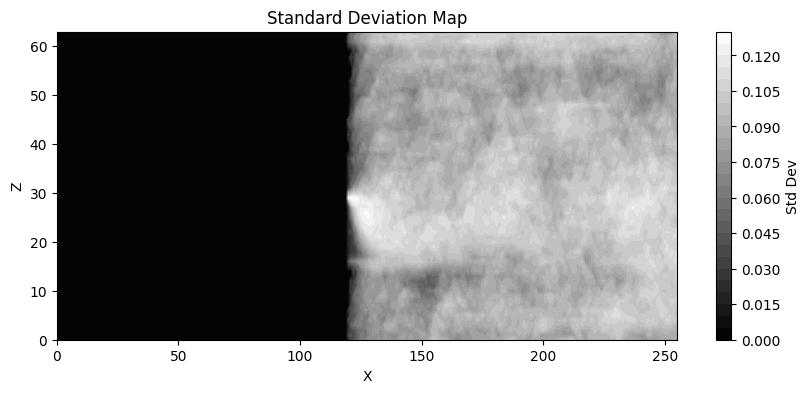

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------
# Load ensemble
# shape: (N, 64, 256)
# -------------------------------------------------
ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/repaint_results/ensemble.npy")

print("Ensemble shape:", ensemble.shape)

# -------------------------------------------------
# Mean and std across realizations
# axis=0 because first dimension = realizations
# -------------------------------------------------
mean_map = np.mean(ensemble, axis=0)

std_map = np.std(ensemble, axis=0)

print("Mean map shape:", mean_map.shape)
print("Std map shape:", std_map.shape)

# -------------------------------------------------
# Plot mean and std contour maps
# -------------------------------------------------

# ---- Mean contour map
plt.figure(figsize=(10,4))

contour_mean = plt.contourf(mean_map, levels=30, cmap="grey")
plt.colorbar(contour_mean, label="Porosity")

plt.title("Mean Porosity Map")
plt.xlabel("X")
plt.ylabel("Z")

# plt.savefig("mean_contour.png", dpi=150)
plt.show()


# ---- Standard deviation contour map
plt.figure(figsize=(10,4))

contour_std = plt.contourf(std_map, levels=30, cmap="grey")
plt.colorbar(contour_std, label="Std Dev")

plt.title("Standard Deviation Map")
plt.xlabel("X")
plt.ylabel("Z")

# plt.savefig("std_contour.png", dpi=150)
plt.show()

## Contour map

Ensemble shape: (100, 64, 256)
Variance map shape: (64, 256)


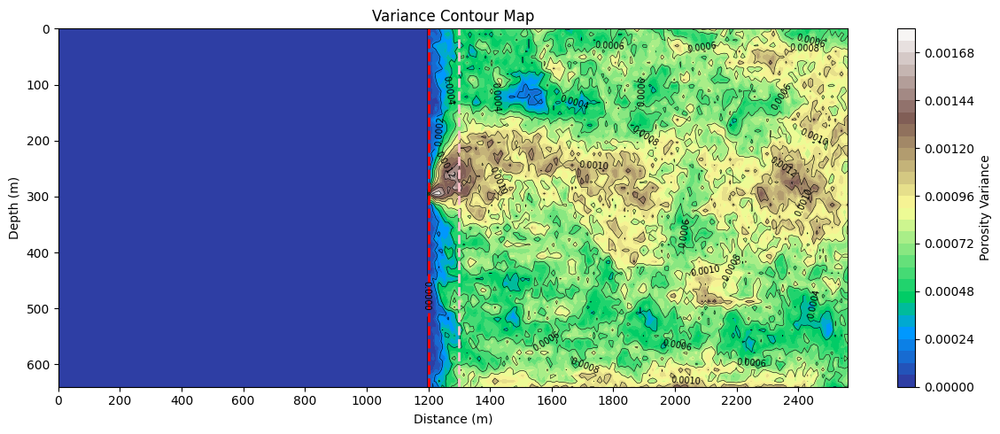

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------
# Load ensemble
# shape = (n_realizations, 64, 256)
# -------------------------------------------------
ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/repaint_results/ensemble.npy")

print("Ensemble shape:", ensemble.shape)
ensemble = np.squeeze(ensemble)

ensemble = ensemble**2 #convertig to variance
ensemble[ensemble < 1e-8] = 0 #avoiding numerical issues
# -------------------------------------------------
# Compute variance map
# variance across realizations
# -------------------------------------------------
variance_map = np.var(ensemble, axis=0)
boundary_px = 120
variance_map[:, :boundary_px] = 0.0
vmax = np.percentile(variance_map, 95)
print("Variance map shape:", variance_map.shape)

# -------------------------------------------------
# Create coordinate system
# -------------------------------------------------
nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)   # distance (m)
z = np.linspace(0, 640, nz)    # depth (m)

X, Z = np.meshgrid(x, z)

# -------------------------------------------------
# Plot variance contour map
# -------------------------------------------------
plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=30,
    cmap="terrain"
)

# contour lines
lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=8,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7)

# colorbar
cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

# mask boundary
mask_boundary = 120 * 10   # 120 pixels × 10m
plt.axvline(
    x=mask_boundary,
    color="red",
    linestyle="--",
    linewidth=2,
    #label="Mask Boundary"
)
plt.axvline(
    x=1300,
    color="pink",
    linestyle="--",
    linewidth=2,
    label="Mask Boundary"
)
plt.xticks(np.arange(0, 2560, 200))
# labels
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("Variance Contour Map")

# invert depth axis
plt.gca().invert_yaxis()

# plt.legend()

plt.tight_layout()

# plt.savefig("variance_contour_map.png", dpi=300)

plt.show()

Ensemble shape: (100, 64, 256)
Variance map shape: (64, 256)


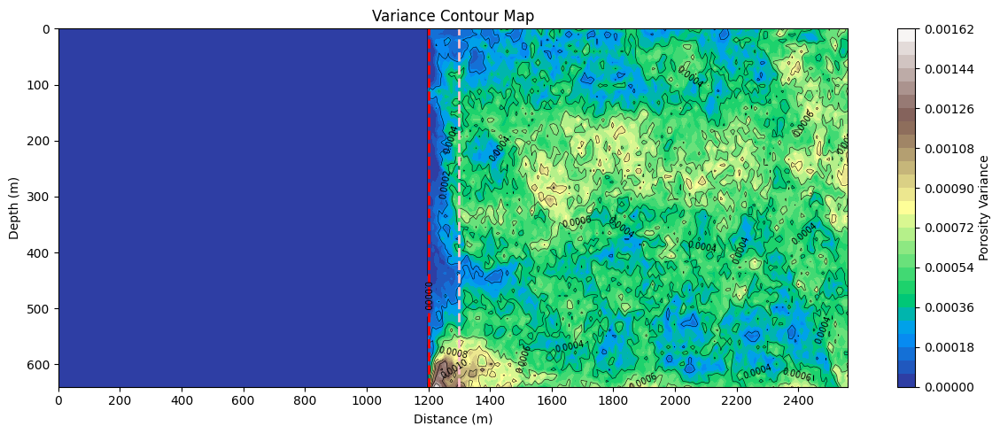

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------
# Load ensemble
# shape = (n_realizations, 64, 256)
# -------------------------------------------------
ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/repaint_results/ensemble.npy")

print("Ensemble shape:", ensemble.shape)
ensemble = np.squeeze(ensemble)

ensemble = ensemble**2 #convertig to variance
ensemble[ensemble < 1e-8] = 0 #avoiding numerical issues
# -------------------------------------------------
# Compute variance map
# variance across realizations
# -------------------------------------------------
variance_map = np.var(ensemble, axis=0)
boundary_px = 120
variance_map[:, :boundary_px] = 0.0
vmax = np.percentile(variance_map, 95)
print("Variance map shape:", variance_map.shape)

# -------------------------------------------------
# Create coordinate system
# -------------------------------------------------
nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)   # distance (m)
z = np.linspace(0, 640, nz)    # depth (m)

X, Z = np.meshgrid(x, z)

# -------------------------------------------------
# Plot variance contour map
# -------------------------------------------------
plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=30,
    cmap="terrain"
)

# contour lines
lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=8,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7)

# colorbar
cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

# mask boundary
mask_boundary = 120 * 10   # 120 pixels × 10m
plt.axvline(
    x=mask_boundary,
    color="red",
    linestyle="--",
    linewidth=2,
    #label="Mask Boundary"
)
plt.axvline(
    x=1300,
    color="pink",
    linestyle="--",
    linewidth=2,
    label="Mask Boundary"
)
plt.xticks(np.arange(0, 2560, 200))
# labels
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("Variance Contour Map")

# invert depth axis
plt.gca().invert_yaxis()

# plt.legend()

plt.tight_layout()

# plt.savefig("variance_contour_map.png", dpi=300)

plt.show()

Ensemble shape: (100, 64, 256)
Shape after squeeze: (100, 64, 256)


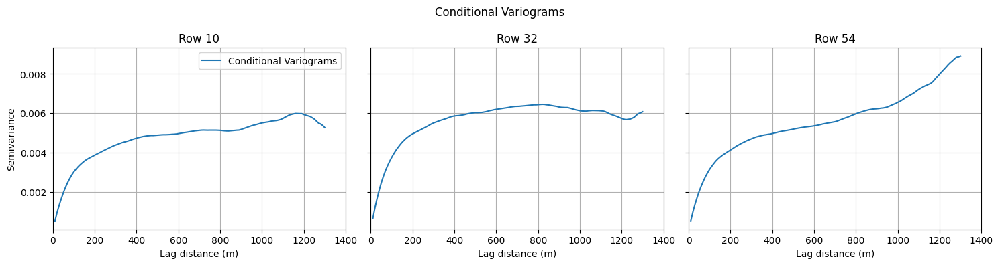

Samples used: 100
Selected rows: [10, 32, 54]
Boundary: 120


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt

# load ensemble
patch_files = np.load("/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/repaint_results/ensemble.npy")
print("Ensemble shape:", patch_files.shape)

samples = np.squeeze(patch_files)
print("Shape after squeeze:", samples.shape)

N, H, W = samples.shape

# parameters
boundary   = 120
points_y   = [10, H // 2, H - 10]
half_window = 4
max_lag    = W - boundary - 5
lags       = np.arange(1, max_lag)

# vectorized variogram computation
variograms = {}
for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    window = samples[:, y0:y1, boundary:]  # (N, n_rows, n_cols_right)

    gamma = []
    for h in lags:
        d = window[:, :, h:] - window[:, :, :-h]
        gamma.append(0.5 * np.mean(d**2))

    variograms[py] = np.array(gamma)

lags_m = lags * 10  # convert pixels to meters

# plot
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Variograms")
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)
    axes[i].set_xlim(0, 1400)  # truncate unstable large lags

axes[0].set_ylabel("Semivariance")
axes[0].legend()
plt.suptitle("Conditional Variograms", fontsize=12)
plt.tight_layout()
plt.show()

print("Samples used:", N)
print("Selected rows:", points_y)
print("Boundary:", boundary)

Ensemble shape: (100, 64, 256)
Variance map shape: (64, 256)


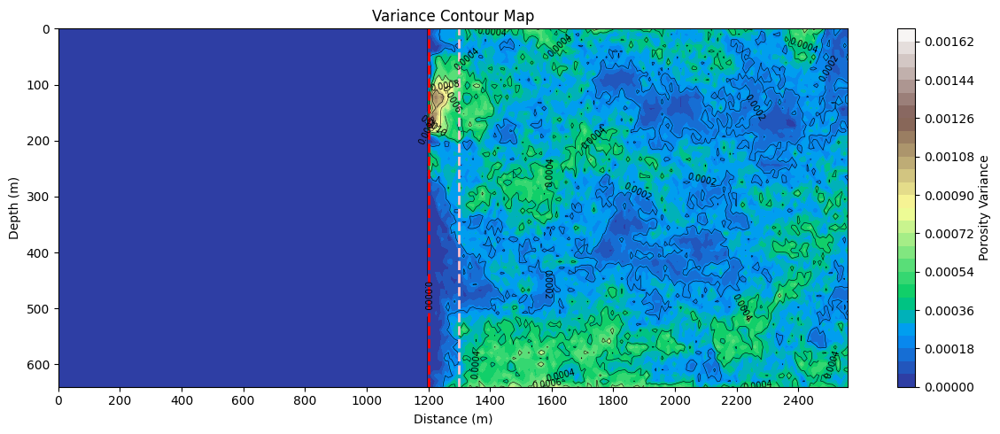

In [1]:
#wider unet archi
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------------------------
# Load ensemble
# shape = (n_realizations, 64, 256)
# -------------------------------------------------
ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/repaint_results/ensemble.npy")

print("Ensemble shape:", ensemble.shape)
ensemble = np.squeeze(ensemble)

ensemble = ensemble**2 #convertig to variance
ensemble[ensemble < 1e-8] = 0 #avoiding numerical issues
# -------------------------------------------------
# Compute variance map
# variance across realizations
# -------------------------------------------------
variance_map = np.var(ensemble, axis=0)
boundary_px = 120
variance_map[:, :boundary_px] = 0.0
vmax = np.percentile(variance_map, 95)
print("Variance map shape:", variance_map.shape)

# -------------------------------------------------
# Create coordinate system
# -------------------------------------------------
nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)   # distance (m)
z = np.linspace(0, 640, nz)    # depth (m)

X, Z = np.meshgrid(x, z)

# -------------------------------------------------
# Plot variance contour map
# -------------------------------------------------
plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=30,
    cmap="terrain"
)

# contour lines
lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=8,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7)

# colorbar
cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

# mask boundary
mask_boundary = 120 * 10   # 120 pixels × 10m
plt.axvline(
    x=mask_boundary,
    color="red",
    linestyle="--",
    linewidth=2,
    #label="Mask Boundary"
)
plt.axvline(
    x=1300,
    color="pink",
    linestyle="--",
    linewidth=2,
    label="Mask Boundary"
)
plt.xticks(np.arange(0, 2560, 200))
# labels
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("Variance Contour Map")

# invert depth axis
plt.gca().invert_yaxis()

# plt.legend()

plt.tight_layout()

# plt.savefig("variance_contour_map.png", dpi=300)

plt.show()

In [ ]:
#same conditionng for basleine and wider unet

Ensemble shape: (100, 64, 256)
Variance map shape: (64, 256)


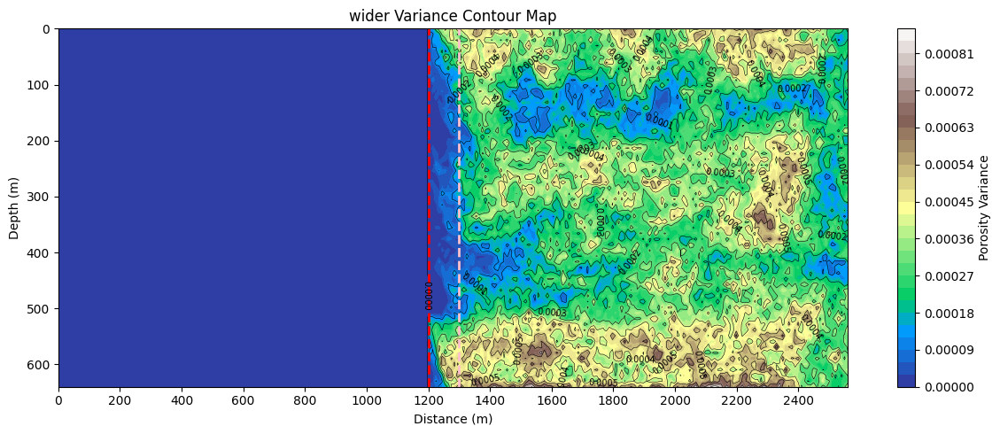

In [ ]:
#wider unet archi
import numpy as np
import matplotlib.pyplot as plt

ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/wider/ensemble.npy")

print("Ensemble shape:", ensemble.shape)
ensemble = np.squeeze(ensemble)

ensemble = ensemble**2 #convertig to variance
ensemble[ensemble < 1e-8] = 0 #avoiding numerical issues

#computing variance map and variance across realizations

variance_map = np.var(ensemble, axis=0)
boundary_px = 120
variance_map[:, :boundary_px] = 0.0
vmax = np.percentile(variance_map, 95)
print("Variance map shape:", variance_map.shape)


#this is fo creating coordinate system

nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)   #distance in m
z = np.linspace(0, 640, nz)    #depth

X, Z = np.meshgrid(x, z)


plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=30,
    cmap="terrain"
)

#contour lines
lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=8,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7)

#colorbar
cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

#mask boundary
mask_boundary = 120 * 10   # 120 pixels × 10m
plt.axvline(
    x=mask_boundary,
    color="red",
    linestyle="--",
    linewidth=2,
    #label="Mask Boundary"
)
plt.axvline(
    x=1300,
    color="pink",
    linestyle="--",
    linewidth=2,
    label="Mask Boundary"
)
plt.xticks(np.arange(0, 2560, 200))
# labels
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("wider Variance Contour Map")

# invert depth axis
plt.gca().invert_yaxis()

# plt.legend()

plt.tight_layout()

# plt.savefig("variance_contour_map.png", dpi=300)

plt.show()

Ensemble shape: (100, 64, 256)
Variance map shape: (64, 256)


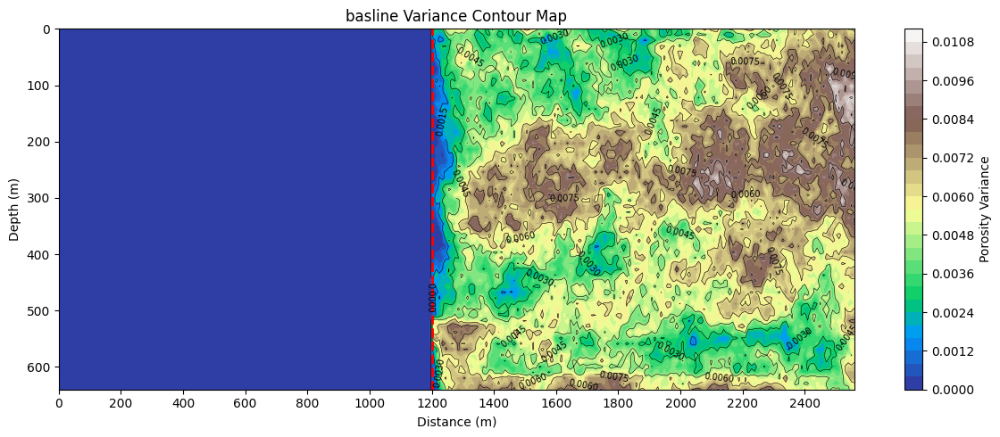

In [ ]:
#baseline unet archi
import numpy as np
import matplotlib.pyplot as plt


ensemble = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/baseline/ensemble.npy")

print("Ensemble shape:", ensemble.shape)
ensemble = np.squeeze(ensemble)

# ensemble = ensemble**2 #convertig to variance
ensemble[ensemble < 1e-8] = 0 #avoiding numerical issues


#computing variance map and variance across realizations
variance_map = np.var(ensemble, axis=0)
boundary_px = 120
variance_map[:, :boundary_px] = 0.0
vmax = np.percentile(variance_map, 95)
print("Variance map shape:", variance_map.shape)

#this is fo creating coordinate system
nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)   # distance (m)
z = np.linspace(0, 640, nz)    # depth (m)

X, Z = np.meshgrid(x, z)


plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=30,
    cmap="terrain"
)

# contour lines
lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=8,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7)

# colorbar
cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

# mask boundary
mask_boundary = 120 * 10   #120 pixels × 10m
plt.axvline(
    x=mask_boundary,
    color="red",
    linestyle="--",
    linewidth=2,
    #label="Mask Boundary"
)
# plt.axvline(
#     x=1300,
#     color="pink",
#     linestyle="--",
#     linewidth=2,
#     label="Mask Boundary"
# )
plt.xticks(np.arange(0, 2560, 200))
# labels
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("basline Variance Contour Map")


plt.gca().invert_yaxis()

# plt.legend()

plt.tight_layout()

# plt.savefig("variance_contour_map.png", dpi=300)

plt.show()

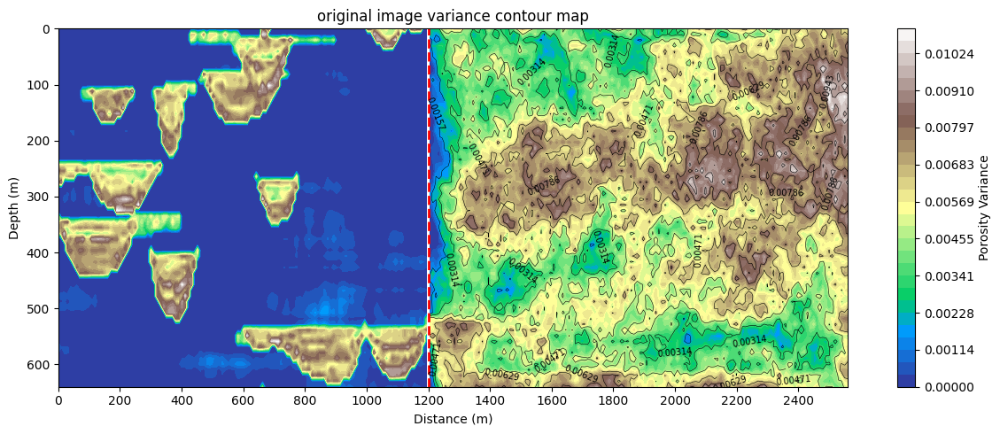

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import os


ensemble_path = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/baseline/ensemble.npy"

data_folder = "/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/sliced_data/XZ_numpy_patches"
fixed_idx = 100
boundary_px = 120
dx = 10


ensemble = np.load(ensemble_path)
ensemble = np.squeeze(ensemble)

variance_map = np.var(ensemble, axis=0)

#only show variance in unknown region
variance_plot = variance_map.copy()
variance_plot[:, :boundary_px] = np.nan


#loadin g original image

paths = sorted([
    os.path.join(data_folder, f)
    for f in os.listdir(data_folder)
    if f.endswith(".npy")
])

original = np.load(paths[fixed_idx]).astype(np.float32)

#only show original known region
known_plot = original.copy()
known_plot[:, boundary_px:] = np.nan


nz, nx = original.shape

# x = np.arange(nx) * dx
# z = np.arange(nz) * dx
x = np.linspace(0, 2560, nx)
z = np.linspace(0, 640, nz)
X, Z = np.meshgrid(x, z)

boundary_m = boundary_px * dx


#level
#color scale for known porosity
porosity_levels = np.linspace(
    np.nanmin(known_plot),
    np.nanmax(known_plot),
    30
)

#color scale for variance
# vmin = 0
# vmax = np.percentile(variance_map[:, boundary_px:], 95)
vmin = 0.0
vmax = 0.011
variance_levels = np.linspace(vmin, vmax, 30)


plt.figure(figsize=(12, 5))

#known porosity contour on left
known_cf = plt.contourf(
    X,
    Z,
    known_plot,
    levels=porosity_levels,
    cmap="terrain"
)

#variance contour on right
var_cf = plt.contourf(
    X,
    Z,
    variance_plot,
    levels=variance_levels,
    cmap="terrain"
)

#contour lines for variance
var_lines = plt.contour(
    X,
    Z,
    variance_plot,
    levels=np.linspace(vmin, vmax, 8),
    colors="black",
    linewidths=0.4
)

plt.clabel(var_lines, inline=True, fontsize=7, fmt="%.5f")

#boundary line
plt.axvline(
    x=boundary_m,
    color="red",
    linestyle="--",
    linewidth=2
)

#colorbar for variance
cbar = plt.colorbar(var_cf)
cbar.set_label("Porosity Variance")

plt.xticks(np.arange(0, nx * dx + 1, 200))
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("original image variance contour map")

plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

(64, 256)


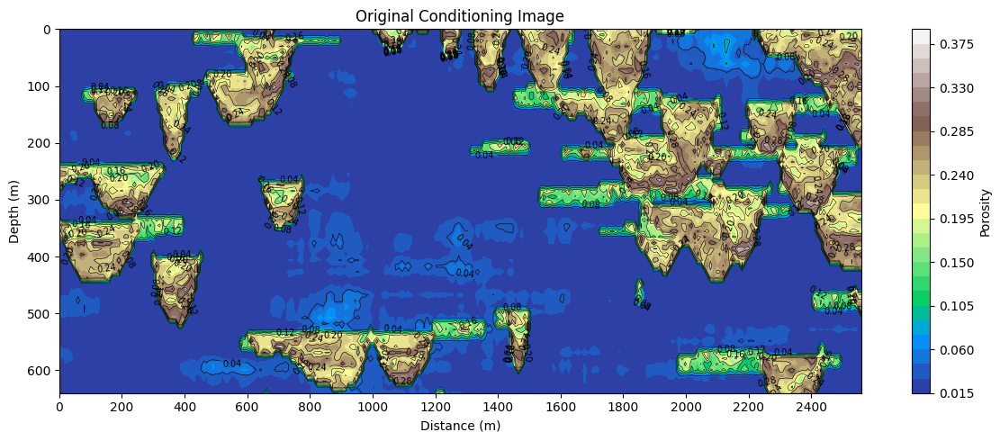

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import os

# -----------------------------
# Load original conditioning image
# -----------------------------
data_folder = "/Home/siv36/hesal5042/Research/NORCE/inPainting_diffusionModel/Geology/sliced_data/XZ_numpy_patches"

idx = 100   # same conditioning image used for RePaint

paths = sorted([
    os.path.join(data_folder, f)
    for f in os.listdir(data_folder)
    if f.endswith(".npy")
])

img = np.load(paths[idx]).astype(np.float32)

print(img.shape)

# -----------------------------
# Coordinates
# -----------------------------
nx = img.shape[1]
nz = img.shape[0]

x = np.linspace(0, 2560, nx)
z = np.linspace(0, 640, nz)

X, Z = np.meshgrid(x, z)

# -----------------------------
# Contour map
# -----------------------------
plt.figure(figsize=(12,5))

contour = plt.contourf(
    X,
    Z,
    img,
    levels=30,
    cmap="terrain"
)

lines = plt.contour(
    X,
    Z,
    img,
    levels=8,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7)

cbar = plt.colorbar(contour)
cbar.set_label("Porosity")

plt.xticks(np.arange(0, 2560, 200))
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("Original Conditioning Image")

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

Ensemble shape: (100, 64, 256)


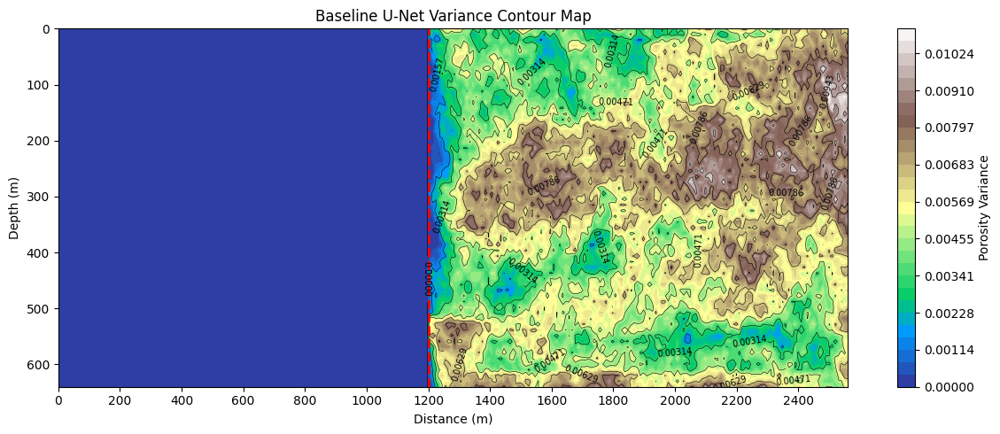

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

ensemble_path = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/baseline/ensemble.npy"

ensemble = np.load(ensemble_path)
ensemble = np.squeeze(ensemble)

print("Ensemble shape:", ensemble.shape)

ensemble[ensemble < 1e-8] = 0

variance_map = np.var(ensemble, axis=0)

boundary_px = 120
variance_map[:, :boundary_px] = 0.0

nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)
z = np.linspace(0, 640, nz)

X, Z = np.meshgrid(x, z)

#same scalinf for both models
vmin = 0.0
vmax = 0.011

levels = np.linspace(vmin, vmax, 30)
line_levels = np.linspace(vmin, vmax, 8)

plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=levels,
    cmap="terrain",
    vmin=vmin,
    vmax=vmax
)

lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=line_levels,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7, fmt="%.5f")

cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

plt.axvline(
    x=boundary_px * 10,
    color="red",
    linestyle="--",
    linewidth=2
)

plt.xticks(np.arange(0, 2560, 200))
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("Baseline U-Net Variance Contour Map")

plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Ensemble shape: (100, 64, 256)


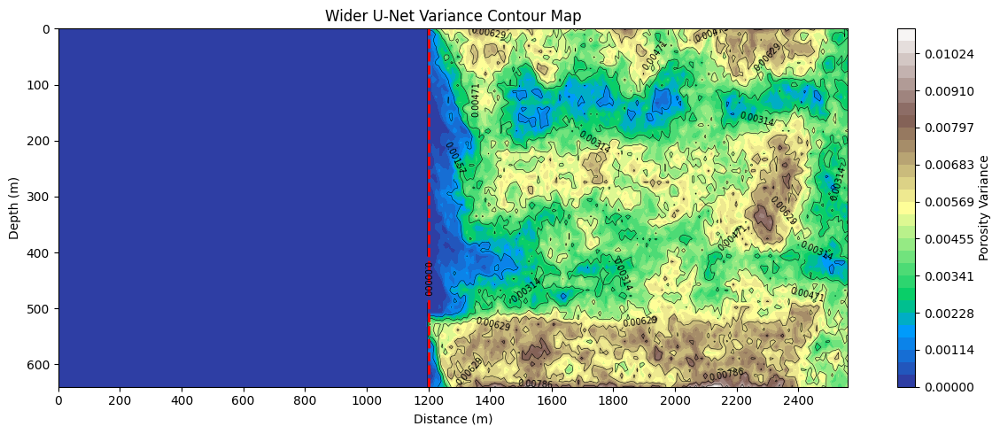

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

ensemble_path = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/wider/ensemble.npy"

ensemble = np.load(ensemble_path)
ensemble = np.squeeze(ensemble)

print("Ensemble shape:", ensemble.shape)

ensemble[ensemble < 1e-8] = 0

variance_map = np.var(ensemble, axis=0)

boundary_px = 120
variance_map[:, :boundary_px] = 0.0

nx = variance_map.shape[1]
nz = variance_map.shape[0]

x = np.linspace(0, 2560, nx)
z = np.linspace(0, 640, nz)

X, Z = np.meshgrid(x, z)


#same scalinf for both models
vmin = 0.0
vmax = 0.011

levels = np.linspace(vmin, vmax, 30)
line_levels = np.linspace(vmin, vmax, 8)

plt.figure(figsize=(12, 5))

contour = plt.contourf(
    X,
    Z,
    variance_map,
    levels=levels,
    cmap="terrain",
    vmin=vmin,
    vmax=vmax
)

lines = plt.contour(
    X,
    Z,
    variance_map,
    levels=line_levels,
    colors="black",
    linewidths=0.4
)

plt.clabel(lines, inline=True, fontsize=7, fmt="%.5f")

cbar = plt.colorbar(contour)
cbar.set_label("Porosity Variance")

plt.axvline(
    x=boundary_px * 10,
    color="red",
    linestyle="--",
    linewidth=2
)

plt.xticks(np.arange(0, 2560, 200))
plt.xlabel("Distance (m)")
plt.ylabel("Depth (m)")
plt.title("Wider U-Net Variance Contour Map")

plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

Ensemble shape: (100, 64, 256)
Shape after squeeze: (100, 64, 256)


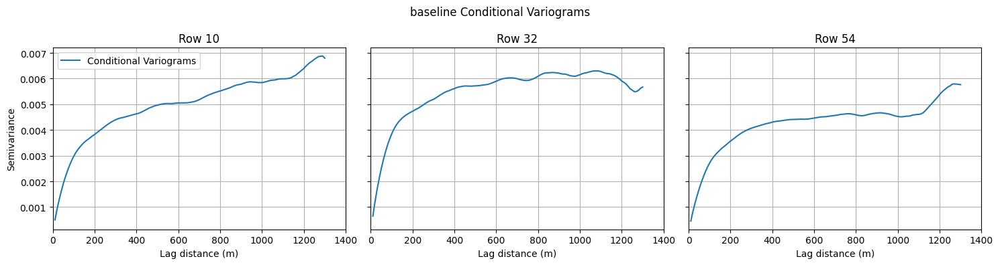

Samples used: 100
Selected rows: [10, 32, 54]
Boundary: 120


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


patch_files = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/baseline/ensemble.npy")
print("Ensemble shape:", patch_files.shape)

samples = np.squeeze(patch_files)
print("Shape after squeeze:", samples.shape)

N, H, W = samples.shape


boundary   = 120
points_y   = [10, H // 2, H - 10]
half_window = 4
max_lag    = W - boundary - 5
lags       = np.arange(1, max_lag)


variograms = {}
for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    window = samples[:, y0:y1, boundary:]

    gamma = []
    for h in lags:
        d = window[:, :, h:] - window[:, :, :-h]
        gamma.append(0.5 * np.mean(d**2))

    variograms[py] = np.array(gamma)

lags_m = lags * 10  #pixels to meters

# plot
fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Variograms")
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)
    axes[i].set_xlim(0, 1400) 

axes[0].set_ylabel("Semivariance")
axes[0].legend()
plt.suptitle("baseline Conditional Variograms", fontsize=12)
plt.tight_layout()
plt.show()

print("Samples used:", N)
print("Selected rows:", points_y)
print("Boundary:", boundary)

Ensemble shape: (100, 64, 256)
Shape after squeeze: (100, 64, 256)


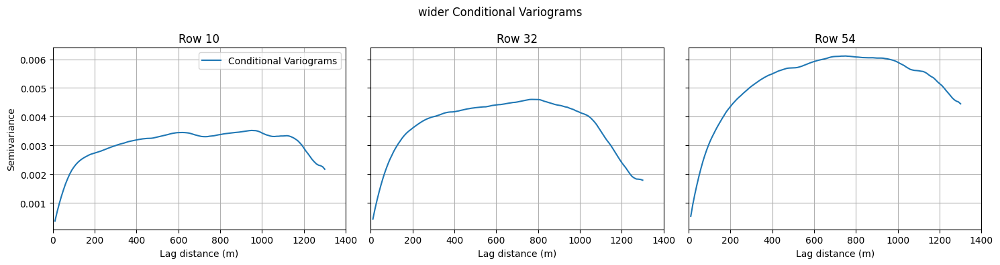

Samples used: 100
Selected rows: [10, 32, 54]
Boundary: 120


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


patch_files = np.load("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/wider/ensemble.npy")
print("Ensemble shape:", patch_files.shape)

samples = np.squeeze(patch_files)
print("Shape after squeeze:", samples.shape)

N, H, W = samples.shape


boundary   = 120
points_y   = [10, H // 2, H - 10]
half_window = 4
max_lag    = W - boundary - 5
lags       = np.arange(1, max_lag)


variograms = {}
for py in points_y:
    y0 = max(0, py - half_window)
    y1 = min(H, py + half_window + 1)

    window = samples[:, y0:y1, boundary:] 

    gamma = []
    for h in lags:
        d = window[:, :, h:] - window[:, :, :-h]
        gamma.append(0.5 * np.mean(d**2))

    variograms[py] = np.array(gamma)

lags_m = lags * 10  #pixels to meters


fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)
for i, py in enumerate(points_y):
    axes[i].plot(lags_m, variograms[py], label="Conditional Variograms")
    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].grid(True)
    axes[i].set_xlim(0, 1400) 

axes[0].set_ylabel("Semivariance")
axes[0].legend()
plt.suptitle("wider Conditional Variograms", fontsize=12)
plt.tight_layout()
plt.show()

print("Samples used:", N)
print("Selected rows:", points_y)
print("Boundary:", boundary)

In [1]:
# import os
# import glob
# import numpy as np
# import matplotlib.pyplot as plt


# patch_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology/Geology_Code/output/unet/"


# patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))

# print(f"Total patch files found: {len(patch_files)}")

# np.random.seed(0)
# selected_files = np.random.choice(patch_files, 100, replace=False)


# test_data = np.stack([np.load(f) for f in selected_files])

# print("Test data shape:", test_data.shape)


# test_data = np.squeeze(test_data)
# print("Shape after squeeze:", test_data.shape)

# N, H, W = test_data.shape


# boundary = 120
# points_y = [10, H // 2, H - 10]
# half_window = 4

# max_lag = W - boundary - 5
# lags = np.arange(1, max_lag)


# variograms = {}

# for py in points_y:
#     y0 = max(0, py - half_window)
#     y1 = min(H, py + half_window + 1)

#     gamma = []

#     for h in lags:
#         diffs = []

#         for n in range(N):
#             window = test_data[n, y0:y1, boundary:]   

#             for r in range(window.shape[0]):
#                 row = window[r, :]
#                 d = row[h:] - row[:-h]
#                 diffs.extend(d**2)

#         gamma.append(0.5 * np.mean(diffs) if len(diffs) > 0 else np.nan)

#     variograms[py] = np.array(gamma)


# lags_m = lags * 10

# fig, axes = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

# for i, py in enumerate(points_y):
#     axes[i].plot(lags_m, variograms[py], label="wider unconditional Data", linewidth=2)
#     axes[i].set_title(f"Row {py}")
#     axes[i].set_xlabel("Lag distance (m)")
#     axes[i].grid(True)

# axes[0].set_ylabel("Semivariance")
# axes[0].legend()

# plt.tight_layout()
# # plt.savefig("/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/histogram/variograms/50_variogram_cond.png", dpi=300)
# plt.show()


# print("Selected rows:", points_y)
# print("Boundary:", boundary)

Test samples: (2200, 64, 256)
Baseline samples: (100, 64, 256)
Wider samples: (100, 64, 256)


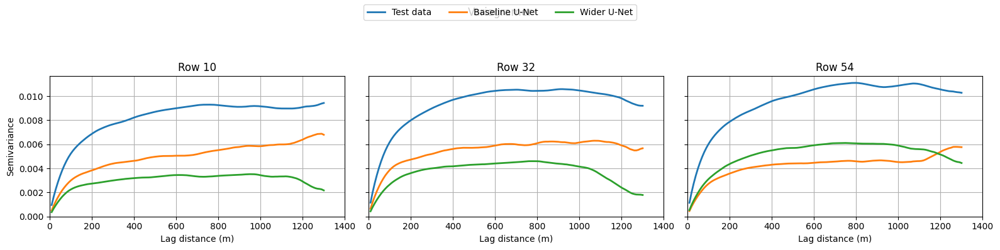

In [27]:
import os
import numpy as np
import matplotlib.pyplot as plt

test_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/slice_XZ_numpy_patches"

baseline_path = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/baseline/ensemble.npy"

wider_path = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/wider/ensemble.npy"

# load test data
test_paths = sorted([
    os.path.join(test_folder, fname)
    for fname in os.listdir(test_folder)
    if fname.endswith(".npy")
])

test_samples = []
for path in test_paths:
    arr = np.load(path).astype(np.float32)
    test_samples.append(arr)

test_samples = np.stack(test_samples, axis=0)

# load model ensembles
baseline_samples = np.squeeze(np.load(baseline_path))
wider_samples = np.squeeze(np.load(wider_path))

print("Test samples:", test_samples.shape)
print("Baseline samples:", baseline_samples.shape)
print("Wider samples:", wider_samples.shape)

boundary = 120
half_window = 4

N, H, W = baseline_samples.shape
points_y = [10, H // 2, H - 10]

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)
lags_m = lags * 10

def compute_variograms(samples):
    samples = np.squeeze(samples)

    if samples.ndim == 2:
        samples = samples[np.newaxis, :, :]

    variograms = {}

    for py in points_y:
        y0 = max(0, py - half_window)
        y1 = min(H, py + half_window + 1)

        window = samples[:, y0:y1, boundary:]

        gamma = []
        for h in lags:
            d = window[:, :, h:] - window[:, :, :-h]
            gamma.append(0.5 * np.mean(d ** 2))

        variograms[py] = np.array(gamma)

    return variograms

var_test = compute_variograms(test_samples)
var_baseline = compute_variograms(baseline_samples)
var_wider = compute_variograms(wider_samples)

# same y-axis across all rows
ymax = max(
    max(np.max(var_test[py]) for py in points_y),
    max(np.max(var_baseline[py]) for py in points_y),
    max(np.max(var_wider[py]) for py in points_y),
) * 1.05

fig, axes = plt.subplots(1, 3, figsize=(16, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, var_test[py], label="Test data", linewidth=2)
    axes[i].plot(lags_m, var_baseline[py], label="Baseline U-Net", linewidth=2)
    axes[i].plot(lags_m, var_wider[py], label="Wider U-Net", linewidth=2)

    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].set_xlim(0, 1400)
    axes[i].set_ylim(0, ymax)
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=3)

plt.suptitle("Variogramer", fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.88])
plt.show()

Unconditional samples: (100, 64, 256)
Test samples: (2200, 64, 256)
Baseline samples: (100, 64, 256)


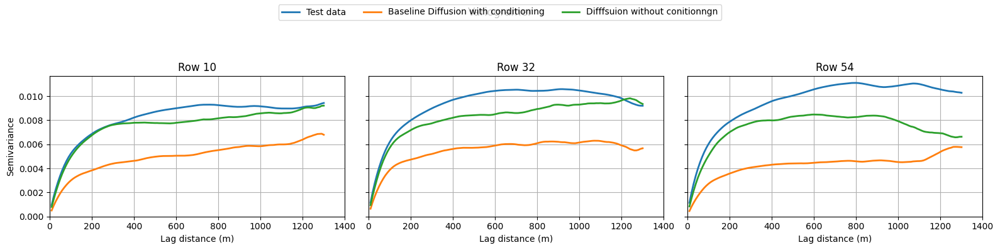

In [31]:
import os
import numpy as np
import matplotlib.pyplot as plt

test_folder = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/slice_XZ_numpy_patches"

baseline_path = "/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches/unet/baseline/ensemble.npy"

unconditional_path ="/Home/siv36/hesal5042/Research/NORCE/hello/RePaint/guided_diffusion_mnist/guided_diffusion/Geology/Geology_Code/output/train_generated_patches"

# get all .npy files
patch_files = sorted(glob.glob(os.path.join(patch_folder, "*.npy")))


# load test data
test_paths = sorted([
    os.path.join(test_folder, fname)
    for fname in os.listdir(test_folder)
    if fname.endswith(".npy")
])

test_samples = []
for path in test_paths:
    arr = np.load(path).astype(np.float32)
    test_samples.append(arr)

test_samples = np.stack(test_samples, axis=0)

uncond_paths = sorted([
    os.path.join(unconditional_path, f)
    for f in os.listdir(unconditional_path)
    if f.endswith(".npy")
])

uncond_samples = []
for path in uncond_paths:
    arr = np.load(path).astype(np.float32)
    arr = np.squeeze(arr)

    if arr.ndim == 2:
        uncond_samples.append(arr)

uncond_samples = np.stack(uncond_samples, axis=0)

print("Unconditional samples:", uncond_samples.shape)

# load model ensembles
baseline_samples = np.squeeze(np.load(baseline_path))


print("Test samples:", test_samples.shape)
print("Baseline samples:", baseline_samples.shape)

boundary = 120
half_window = 4

N, H, W = baseline_samples.shape
points_y = [10, H // 2, H - 10]

max_lag = W - boundary - 5
lags = np.arange(1, max_lag)
lags_m = lags * 10

def compute_variograms(samples):
    samples = np.squeeze(samples)

    if samples.ndim == 2:
        samples = samples[np.newaxis, :, :]

    variograms = {}

    for py in points_y:
        y0 = max(0, py - half_window)
        y1 = min(H, py + half_window + 1)

        window = samples[:, y0:y1, boundary:]

        gamma = []
        for h in lags:
            d = window[:, :, h:] - window[:, :, :-h]
            gamma.append(0.5 * np.mean(d ** 2))

        variograms[py] = np.array(gamma)

    return variograms

var_test = compute_variograms(test_samples)
var_baseline = compute_variograms(baseline_samples)
var_uncond = compute_variograms(uncond_samples)

# same y-axis across all rows
ymax = max(
    max(np.max(var_test[py]) for py in points_y),
    max(np.max(var_baseline[py]) for py in points_y),
    max(np.max(var_uncond[py]) for py in points_y),
) * 1.05

fig, axes = plt.subplots(1, 3, figsize=(16, 4), sharey=True)

for i, py in enumerate(points_y):
    axes[i].plot(lags_m, var_test[py], label="Test data", linewidth=2)
    axes[i].plot(lags_m, var_baseline[py], label="Baseline Diffusion with conditioning", linewidth=2)
    axes[i].plot(lags_m, var_uncond[py], label="Difffsuion without conitionngn", linewidth=2)

    axes[i].set_title(f"Row {py}")
    axes[i].set_xlabel("Lag distance (m)")
    axes[i].set_xlim(0, 1400)
    axes[i].set_ylim(0, ymax)
    axes[i].grid(True)

axes[0].set_ylabel("Semivariance")


handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=3)

plt.suptitle("Variogramer", fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.88])
plt.show()